In [95]:
# Basic usage
import os,sys
from datetime import datetime, timedelta
from dotenv import load_dotenv

# Data processing
import pandas as pd
from pandas import to_datetime
import numpy as np
import csv

print (sys.path)
#vscode usage
sys.path.append(os.path.abspath(os.curdir))

# Customized usage
from dao.BikeStationsDao import BikeStation_api
from dao.CurrentWeatherDao import weather_api
from models.BikeStations import Stations

# Web development
from flask_fontawesome import FontAwesome
from flask import Flask, render_template, request, jsonify
from sqlalchemy import create_engine

# Library Imports.
import matplotlib.pyplot as plt
import seaborn as sns
# Allows plots to appear directly in the notebook.
%matplotlib inline

# training model 
from patsy import dmatrices
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score 
import pickle

#Pycharm usage 
#local_path = os.path.abspath(os.curdir)+"/.."
#vs code usage 
local_path = os.path.abspath(os.curdir)

print(local_path)
config_path = local_path+"/.env"
print(config_path)
load_dotenv(config_path)
URI = os.getenv("URI")
PORT = "3306"
PASSWORD = os.getenv("PASSWORD")
DB = os.getenv("DB")
USER = os.getenv("User") # note: USER will get user name of this computer.
mysql_url = "mysql+pymysql://{}:{}@{}:{}/{}".format(USER, PASSWORD, URI, PORT, DB)

['/Users/Hank.Da/Documents/UCD/Semester2/COMP30830-Software Engineering/bike_project/COMP30830_DublinBike', '/Users/Hank.Da/anaconda3/envs/comp30830/lib/python39.zip', '/Users/Hank.Da/anaconda3/envs/comp30830/lib/python3.9', '/Users/Hank.Da/anaconda3/envs/comp30830/lib/python3.9/lib-dynload', '', '/Users/Hank.Da/anaconda3/envs/comp30830/lib/python3.9/site-packages', '/Users/Hank.Da/anaconda3/envs/comp30830/lib/python3.9/site-packages/IPython/extensions', '/Users/Hank.Da/.ipython', '/Users/Hank.Da/Documents/UCD/Semester2/COMP30830-Software Engineering/bike_project/COMP30830_DublinBike', '/Users/Hank.Da/Documents/UCD/Semester2/COMP30830-Software Engineering/bike_project/COMP30830_DublinBike', '/Users/Hank.Da/Documents/UCD/Semester2/COMP30830-Software Engineering/bike_project/COMP30830_DublinBike', '/Users/Hank.Da/Documents/UCD/Semester2/COMP30830-Software Engineering/bike_project/COMP30830_DublinBike']
/Users/Hank.Da/Documents/UCD/Semester2/COMP30830-Software Engineering/bike_project/COM

In [2]:
engine = create_engine(mysql_url, echo=True)
dao_bike = BikeStation_api(engine)

In [3]:
'''Read table from RDS and store it to csv file.'''
def get_station():
    file_name = "stations.csv"
    df = pd.read_sql_query("select * from dbike.stations order by last_update desc",engine)
    df.to_csv(file_name)

def get_weather():
    file_name = "weather.csv"
    df = pd.read_sql_query("select * from dbike.weather order by current desc",engine)
    df.to_csv(file_name)
    
get_station()
get_weather()

2021-04-08 19:59:47,685 INFO sqlalchemy.engine.base.Engine SHOW VARIABLES LIKE 'sql_mode'
2021-04-08 19:59:47,686 INFO sqlalchemy.engine.base.Engine {}
2021-04-08 19:59:47,796 INFO sqlalchemy.engine.base.Engine SHOW VARIABLES LIKE 'lower_case_table_names'
2021-04-08 19:59:47,797 INFO sqlalchemy.engine.base.Engine {}
2021-04-08 19:59:48,016 INFO sqlalchemy.engine.base.Engine SELECT DATABASE()
2021-04-08 19:59:48,017 INFO sqlalchemy.engine.base.Engine {}
2021-04-08 19:59:48,207 INFO sqlalchemy.engine.base.Engine show collation where `Charset` = 'utf8mb4' and `Collation` = 'utf8mb4_bin'
2021-04-08 19:59:48,209 INFO sqlalchemy.engine.base.Engine {}
2021-04-08 19:59:48,315 INFO sqlalchemy.engine.base.Engine SELECT CAST('test plain returns' AS CHAR(60)) AS anon_1
2021-04-08 19:59:48,316 INFO sqlalchemy.engine.base.Engine {}
2021-04-08 19:59:48,413 INFO sqlalchemy.engine.base.Engine SELECT CAST('test unicode returns' AS CHAR(60)) AS anon_1
2021-04-08 19:59:48,415 INFO sqlalchemy.engine.base.E

## 1. Data Preparing 

In [252]:
'''Read csv file as dataframe'''
df_weather = pd.read_csv('weather.csv')
del df_weather["Unnamed: 0"]

df_stations = pd.read_csv('stations.csv')
del df_stations["Unnamed: 0"]


In [253]:
'''Clean weather data'''
def clean_weather_table(df):
    
    feature_column = ["current","feels_like","humidity","wind_speed","wether_id"]
    # df_weather = df[feature_column]
    df = df.rename(columns={'current': 'last_update'})
    df = df.sort_values('last_update')
    df['last_update'] = pd.to_datetime(df['last_update'])
    df = df.set_index('last_update')
    df = df.dropna()

    return df

In [254]:
'''Merge weather and bike table by last_update column'''
def merge_weather_bike(df_weather,df_station):
    tol = pd.Timedelta('5 minute')
    df_merge = pd.merge_asof(left=df_weather,right=df_station,right_index=True,left_index=True,direction='nearest',tolerance=tol)
    
    return df_merge

In [255]:
'''Convert data type'''
def data_type_conversion(df):
    df['period'] = df['period'].astype('int64')
    df['hour'] = df['hour'].astype('int64') 
    df['day_of_week'] = df['day_of_week'].astype('int64') 
#     status_map = {'OPEN':1,'CLOSE':0}
#     df['status'] = df['status'].map(status_map)
    return df


In [256]:
'''Separate stations to specific station and drop redundant columns'''
def separate_stations(df_stations,df_weather):
    
    stations_id = df_stations["number"].unique()
    stations_feature_column = ["last_update","number","bike_stands","available_bikes"]
    drop_column = ['timezone','lat', 'lon', 'description', 'time','period','rain_1h','snow_1h']
    dict_stations = {}

    for id in stations_id:
        dict_stations[id] = df_stations.loc[df_stations['number'] == id][stations_feature_column].sort_values('last_update')
        dict_stations[id] = dict_stations[id].dropna()
        dict_stations[id]['last_update'] = pd.to_datetime(dict_stations[id]['last_update'])
        dict_stations[id] = dict_stations[id].set_index('last_update')
        
        dict_stations[id]['available_bike_ratio'] = dict_stations[id]['available_bikes'] / dict_stations[id]['bike_stands']
        # day_of_week, 0 stands for Mon, 6 stands for Sat
        dict_stations[id]['day_of_week'] = pd.to_datetime(dict_stations[id].index, format='%Y-%m-%d', errors='ignore').dayofweek
        dict_stations[id]['time'] = [d.time() for d in dict_stations[id].index]
        # period = hour*6 + round(min/10)
        dict_stations[id]['period'] = dict_stations[id].apply(lambda x: (int(round(x["time"].minute/10)) + x["time"].hour*6), axis=1)
        dict_stations[id] = merge_weather_bike(df_weather,dict_stations[id])
        dict_stations[id] = dict_stations[id][(dict_stations[id].period % 6 ==0) & (dict_stations[id].period !=0)]  
        dict_stations[id]['hour'] = dict_stations[id]['period']//6
        dict_stations[id] = dict_stations[id].reset_index()

        dict_stations[id] = remove_outlier(dict_stations[id])
        dict_stations[id] = data_type_conversion(dict_stations[id])
        dict_stations[id] = dict_stations[id].dropna()
        dict_stations[id] = dict_stations[id].drop(drop_column, axis = 1)
        dict_stations[id] = dict_stations[id].drop_duplicates().reset_index()
        dict_stations[id] = dict_stations[id].drop(['index'] ,axis = 1)
        
    return dict_stations

In [257]:
'''Remove outlier before training'''
def remove_outlier(df):    
    df = df[np.abs(df["available_bike_ratio"]-df["available_bike_ratio"].mean())<=(3*df["available_bike_ratio"].std())]
    return df

In [258]:
df_weather = clean_weather_table(df_weather)

In [238]:
dict_stations = separate_stations(df_stations,df_weather)

In [240]:
df_36_no_out = dict_stations[36]  
df_36_no_out

,last_update,timezone,wether_id,weather_icon,visibility,wind_speed,wind_deg,wind_gust,temperature,feels_like,...,rain_1h,snow_1h,sunrise,sunset,number,bike_stands,available_bikes,available_bike_ratio,day_of_week,hour
0,2021-03-05 13:52:22,0,803,04d,10000.0,3.09,140.0,0.00,278.35,273.94,...,0.0,0.0,2021-03-05 07:03:21,2021-03-05 18:10:03,36.0,40.0,6.0,0.150,4,14
1,2021-03-05 15:00:16,0,803,04d,10000.0,3.60,140.0,0.00,278.10,273.18,...,0.0,0.0,2021-03-05 07:03:21,2021-03-05 18:10:03,36.0,40.0,5.0,0.125,4,15
2,2021-03-05 17:03:32,0,803,04d,10000.0,4.12,100.0,0.00,277.89,272.70,...,0.0,0.0,2021-03-05 07:03:21,2021-03-05 18:10:03,36.0,40.0,3.0,0.075,4,17
3,2021-03-05 20:00:43,0,802,03n,10000.0,2.57,90.0,0.00,273.68,269.56,...,0.0,0.0,2021-03-05 07:03:21,2021-03-05 18:10:03,36.0,40.0,0.0,0.000,4,20
4,2021-03-05 20:05:01,0,802,03n,10000.0,2.57,90.0,0.00,273.68,269.56,...,0.0,0.0,2021-03-05 07:03:21,2021-03-05 18:10:03,36.0,40.0,0.0,0.000,4,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,2021-04-08 13:05:03,3600,803,04d,10000.0,6.69,250.0,11.83,282.78,279.71,...,0.0,0.0,2021-04-08 05:41:23,2021-04-08 19:11:57,36.0,40.0,19.0,0.475,3,13
647,2021-04-08 13:52:27,3600,803,04d,10000.0,6.17,240.0,12.35,281.79,278.61,...,0.0,0.0,2021-04-08 05:41:23,2021-04-08 19:11:57,36.0,40.0,14.0,0.350,3,14
648,2021-04-08 14:50:55,3600,803,04d,10000.0,8.23,250.0,15.43,283.30,282.09,...,0.0,0.0,2021-04-08 05:41:23,2021-04-08 19:11:57,36.0,40.0,13.0,0.325,3,15
649,2021-04-08 16:01:44,3600,803,04d,10000.0,6.69,240.0,11.83,283.77,282.51,...,0.0,0.0,2021-04-08 05:41:23,2021-04-08 19:11:57,36.0,40.0,14.0,0.350,3,16


In [241]:
print ("Shape Of The Before Ouliers: ",df_36.shape)
print ("Shape Of The After Ouliers: ",df_36_no_out.shape)

Shape Of The Before Ouliers:  (651, 24)
Shape Of The After Ouliers:  (651, 24)


## 2. Data Analytics

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 4.77 µs


[Text(0.5, 0, 'wether_id'), Text(0, 0.5, 'Label')]

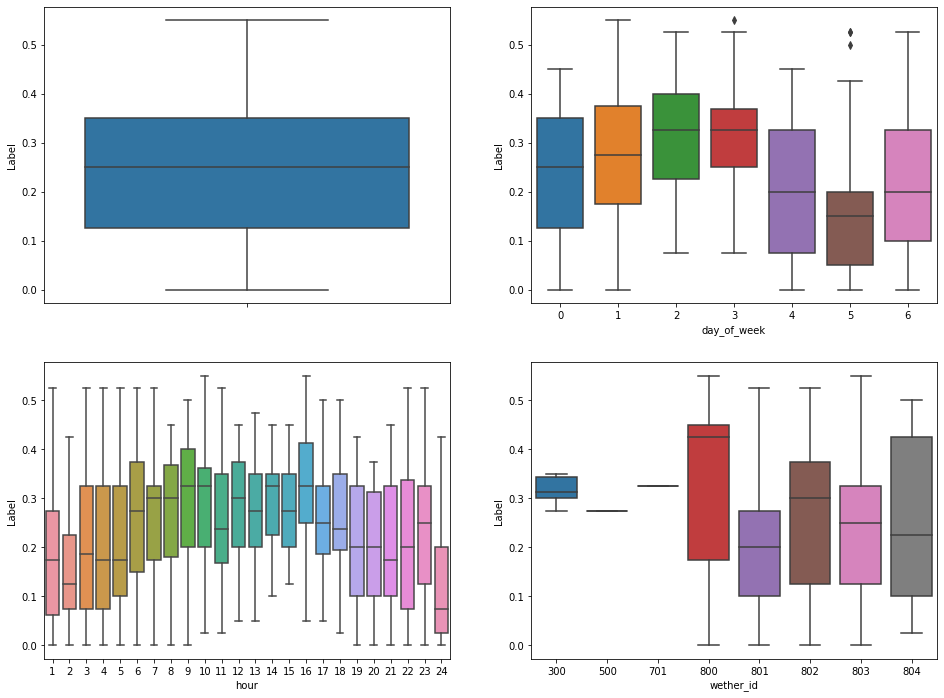

In [242]:
%time
#Analyze the distribution of bike availibility in categorical feature
fig, axes = plt.subplots(nrows=2,ncols=2, figsize=(16,12))
sns.boxplot(data=df_36_no_out,y="available_bike_ratio",orient="v",ax=axes[0][0])
sns.boxplot(data=df_36_no_out,y="available_bike_ratio",x="day_of_week",orient="v",ax=axes[0][1])
sns.boxplot(data=df_36_no_out,y="available_bike_ratio",x="hour",orient="v",ax=axes[1][0])
sns.boxplot(data=df_36_no_out,y="available_bike_ratio",x="wether_id",orient="v",ax=axes[1][1])
axes[0][0].set(ylabel='Label')
axes[0][1].set(xlabel='day_of_week', ylabel='Label')
axes[1][0].set(xlabel='hour', ylabel='Label')
axes[1][1].set(xlabel='wether_id', ylabel='Label')

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 14.1 µs


[Text(0.5, 0, 'wind_deg'), Text(0, 0.5, 'Label')]

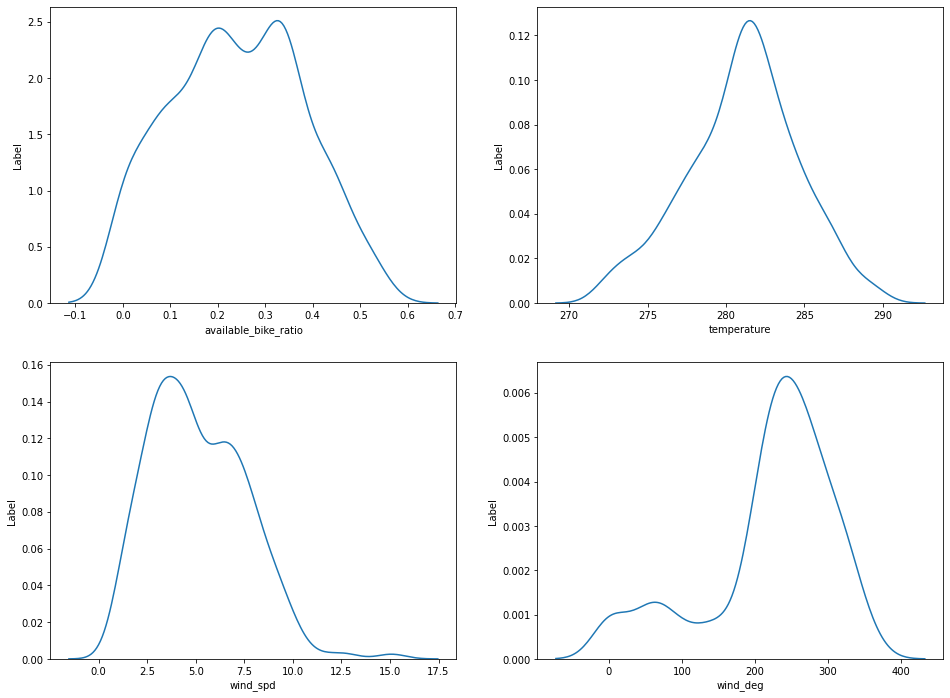

In [243]:
%time
# Analyze the distribution of bike availibility in continuous feature
fig, axes = plt.subplots(nrows=2,ncols=2, figsize=(16,12))
sns.kdeplot(data=df_36_no_out["available_bike_ratio"],ax=axes[0][0])
sns.kdeplot(data=df_36_no_out["temperature"],ax=axes[0][1])
sns.kdeplot(data=df_36_no_out["wind_speed"],ax=axes[1][0])
sns.kdeplot(data=df_36_no_out["wind_deg"],ax=axes[1][1])
# sns.kdeplot(data=combined_df["temperature"],ax=axes[2][0])

axes[0][0].set(xlabel='available_bike_ratio', ylabel='Label')
axes[0][1].set(xlabel='temperature', ylabel='Label')
axes[1][0].set(xlabel='wind_spd', ylabel='Label')
axes[1][1].set(xlabel='wind_deg', ylabel='Label')
# axes[2][0].set(xlabel='temperature', ylabel='Label')

In [244]:
df_36_no_out.corr().available_bike_ratio

timezone               -0.069176
wether_id              -0.057826
visibility             -0.002181
wind_speed              0.179886
wind_deg                0.136801
wind_gust              -0.067417
temperature             0.083769
feels_like              0.021983
temp_min                0.091713
temp_max                0.056176
pressure               -0.091470
humidity               -0.042951
rain_1h                      NaN
snow_1h                      NaN
number                       NaN
bike_stands                  NaN
available_bikes         1.000000
available_bike_ratio    1.000000
day_of_week            -0.195497
hour                    0.016333
Name: available_bike_ratio, dtype: float64

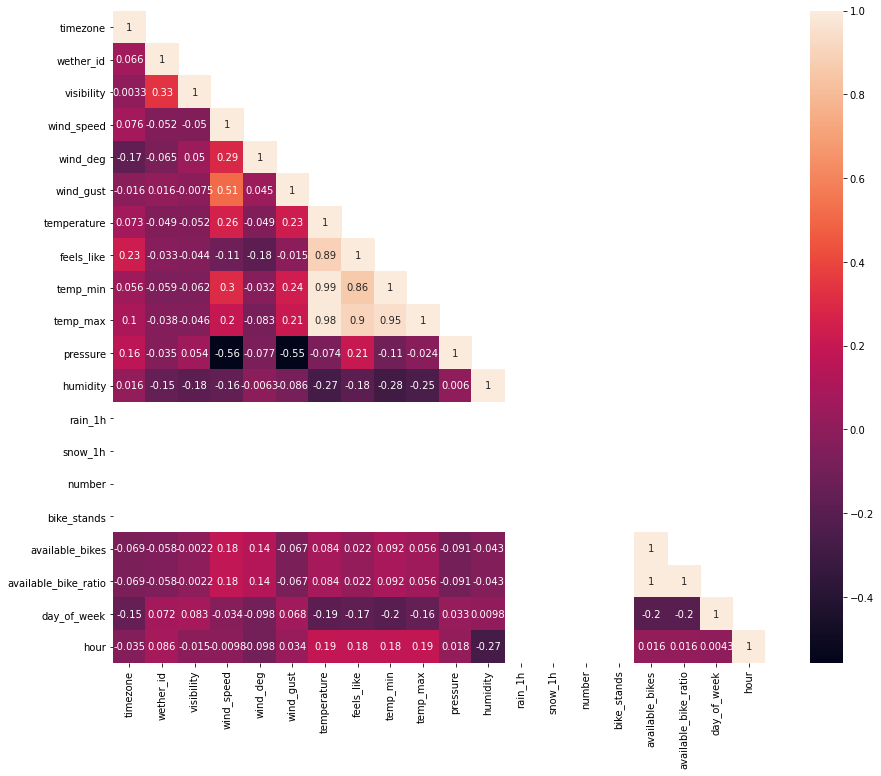

In [245]:
corrMatt = df_36_no_out.corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots(figsize=(16,12))
sns.heatmap(corrMatt, mask=mask, square=True,annot=True)
plt.show()

CPU times: user 1.05 s, sys: 16.1 ms, total: 1.06 s
Wall time: 1.12 s


<AxesSubplot:xlabel='day_of_week', ylabel='available_bike_ratio'>

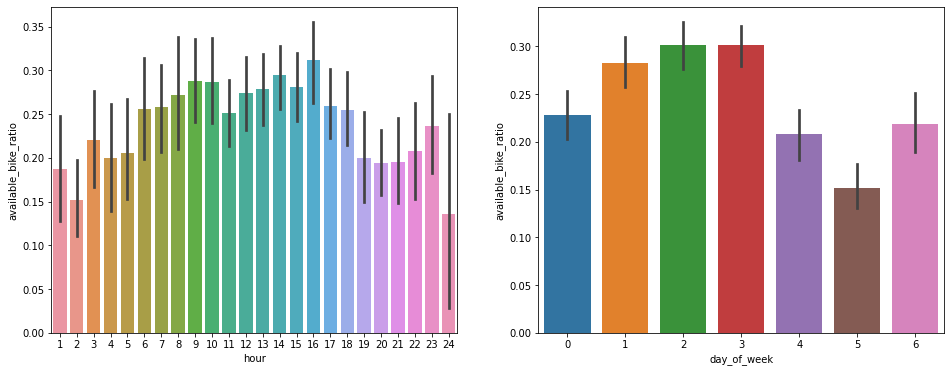

In [246]:
%%time
#Finding distribution between different time
fig, axes = plt.subplots(ncols=2, figsize=(16,6))
sns.barplot(data = df_36_no_out, y = 'available_bike_ratio', x = 'hour', ax=axes[0])
sns.barplot(data = df_36_no_out, y = 'available_bike_ratio', x = 'day_of_week', ax=axes[1])

## 3. Training Model

In [285]:
# Prepare the descriptive features
#print(df.head(10))

# chose the features with correlation greater than 0.1
features= ['day_of_week','hour','wind_speed','temperature']


for id_ in dict_stations:
    
    X = dict_stations[id_][features]
    Y = dict_stations[id_].available_bike_ratio

    test_size = 0.33
    seed = 7

    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

    # Train a model using linear regression from scikit-learn.
    # By default sklearn fits an intercept.
    linreg = LinearRegression().fit(X_train, Y_train)

    # save the model to disk
    filename = 'station_'+str(id_)+'.sav'

    pickle.dump(linreg, open(filename, 'wb'))

In [305]:
def mean_square_error(Y_test,linreg_predictions):
    #Pair the actual and the predicted values
    #This can be done directly with sklearn functions, but below is a manual example to understand how it works
    prediction_errors = Y_test - linreg_predictions
#     print("Actual - Predicted:\n", prediction_errors)
#     print("\n(Actual - Predicted) squared:\n", prediction_errors**2)
#     print("\n Sum of (Actual - Predicted) squared:\n", (prediction_errors**2).sum())

    # Print the Mean Squared Error of the model on the training set
    mse = (prediction_errors** 2).mean()
#     rmse = ((prediction_errors** 2).mean())**0.5

#     print("\nMean Squared Error:\n", mse)
#     print("\nRoot Mean Squared Error:\n", rmse)

#     print("|Actual - Predicted|:\n", abs(prediction_errors))

#     # Print the Mean Absolute Error of the model on the training set
#     mae = abs(prediction_errors).mean()
#     print("\nMean Absolute Error:\n", mae)
    
    return mse

station ID:  21 

0.009991108133750815
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00345081  0.00093817  0.00732027 -0.00012482]

Intercept: 
 0.26912898309288247


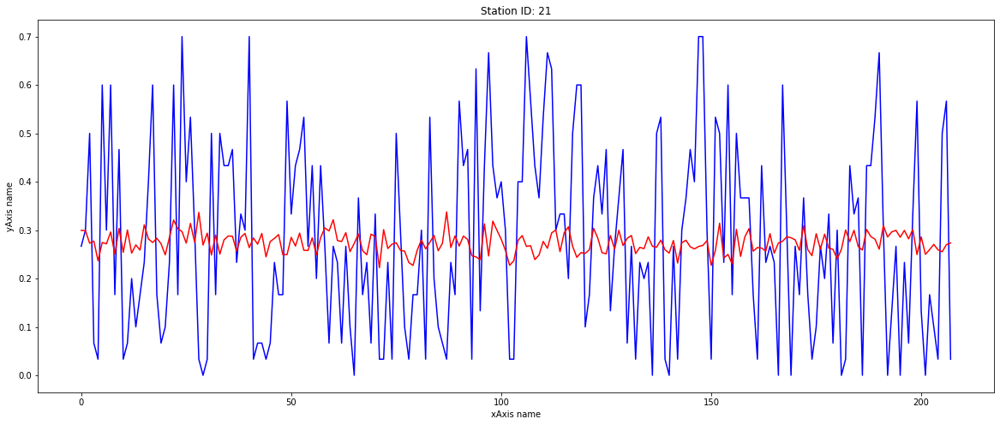

station ID:  10 

0.02998990853267125
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [0.01141968 0.00587199 0.00548712 0.00254866]

Intercept: 
 -0.3052831167422696


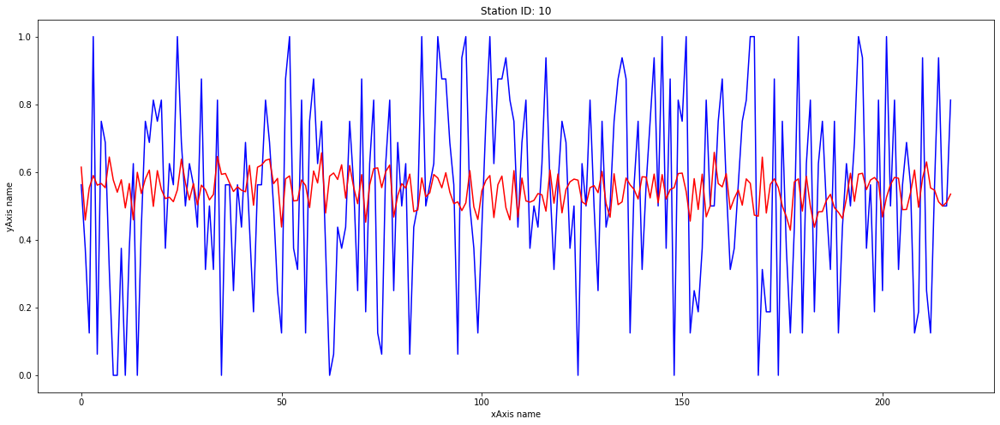

station ID:  100 

0.11138077839194171
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.02222346  0.00715162 -0.0423456  -0.00964411]

Intercept: 
 3.386246711575513


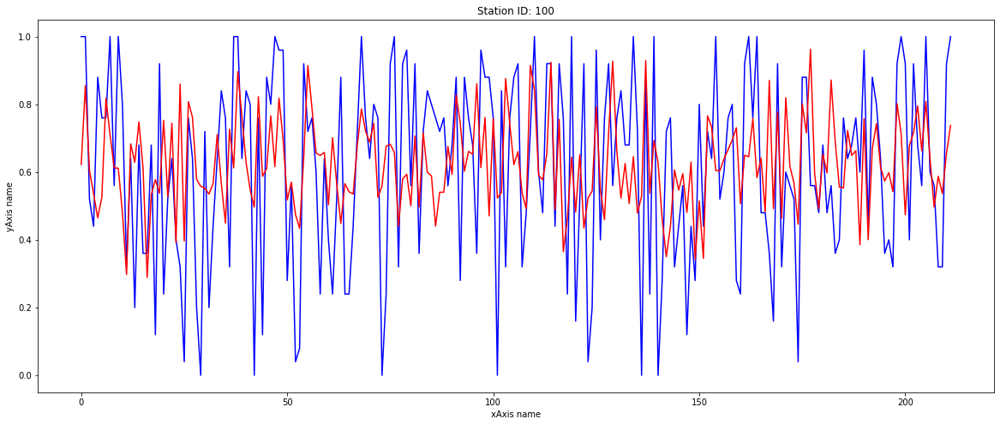

station ID:  64 

0.025473984173281172
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00467557 -0.00037373 -0.00352756 -0.00159747]

Intercept: 
 0.705053176545219


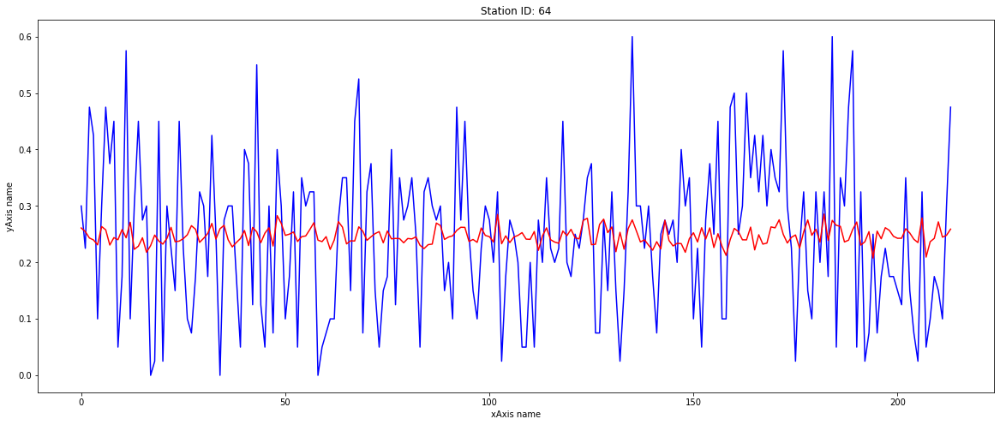

station ID:  32 

-0.02053715058249761
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00129295 -0.00042148  0.002169   -0.00201465]

Intercept: 
 0.8349661436040259


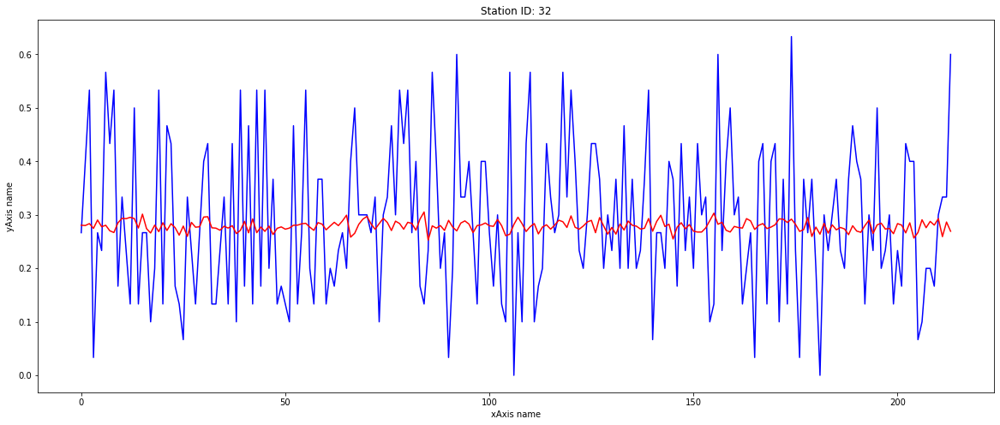

station ID:  34 

0.16210126288691873
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0078469   0.0047942  -0.02183746 -0.02415271]

Intercept: 
 7.378326646711841


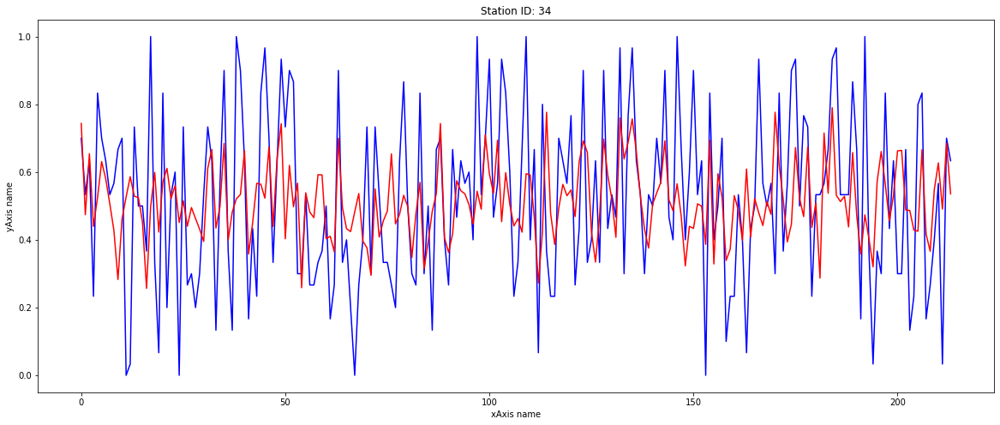

station ID:  53 

-0.02935667522726426
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.0023402   0.00078857 -0.00657222 -0.00437564]

Intercept: 
 1.4311554831195743


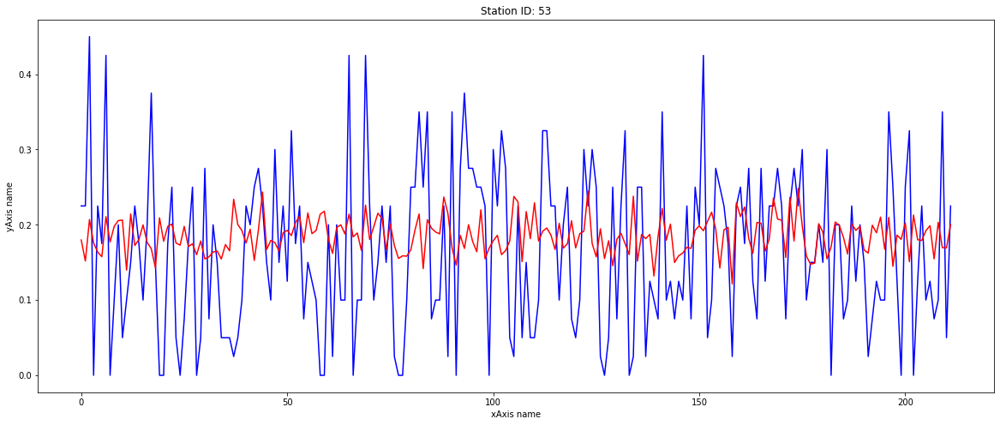

station ID:  29 

-0.004007732589588864
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01352844 -0.00223359  0.01391982 -0.01290016]

Intercept: 
 4.066648764724721


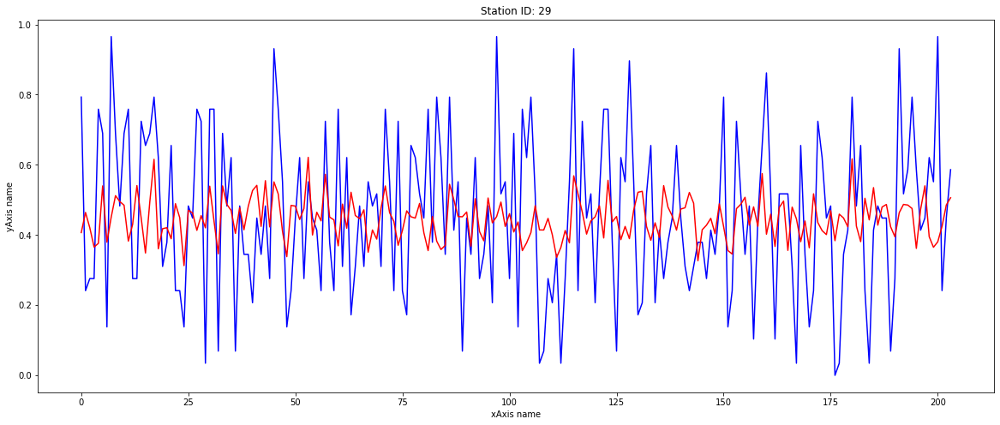

station ID:  95 

0.33039944622910655
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01597828 -0.00042372  0.00190037 -0.02938674]

Intercept: 
 8.735293235733563


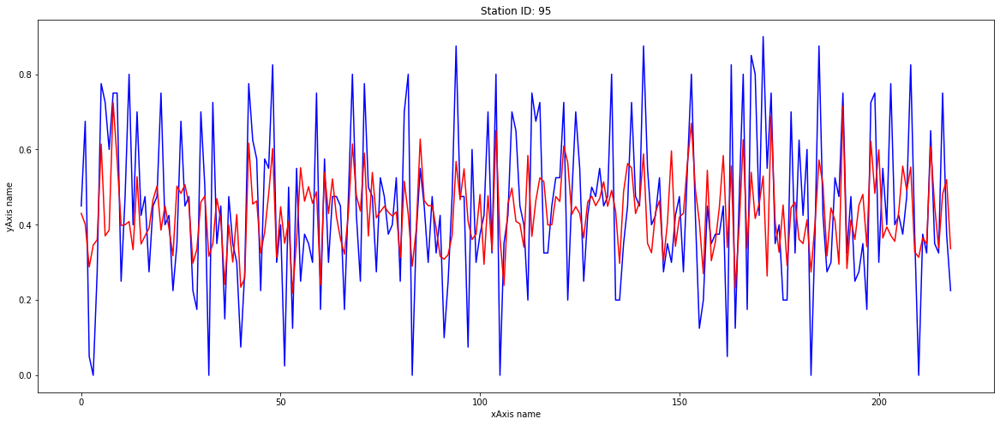

station ID:  69 

0.03763961904046087
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0056899  -0.00283472 -0.00706683 -0.00598623]

Intercept: 
 2.2876144771373697


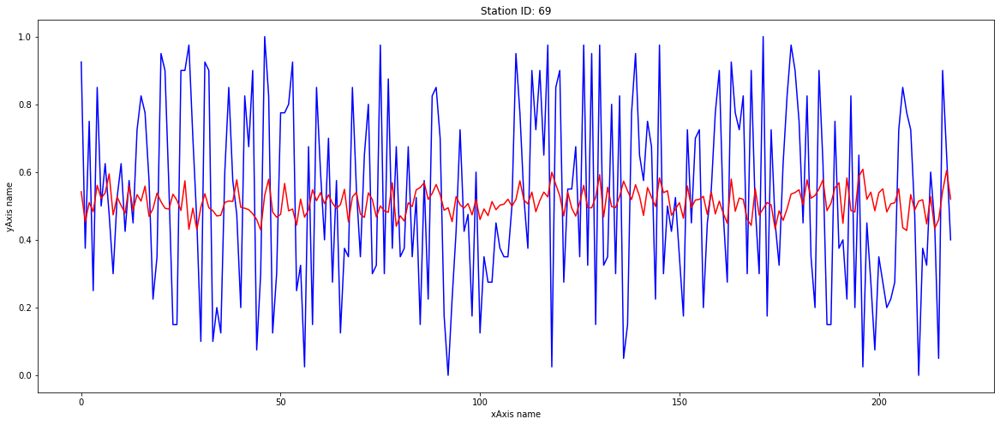

station ID:  28 

0.007126822084221218
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-8.30969224e-03 -4.42430215e-05  1.06807243e-02 -5.76198235e-03]

Intercept: 
 1.9225705305727208


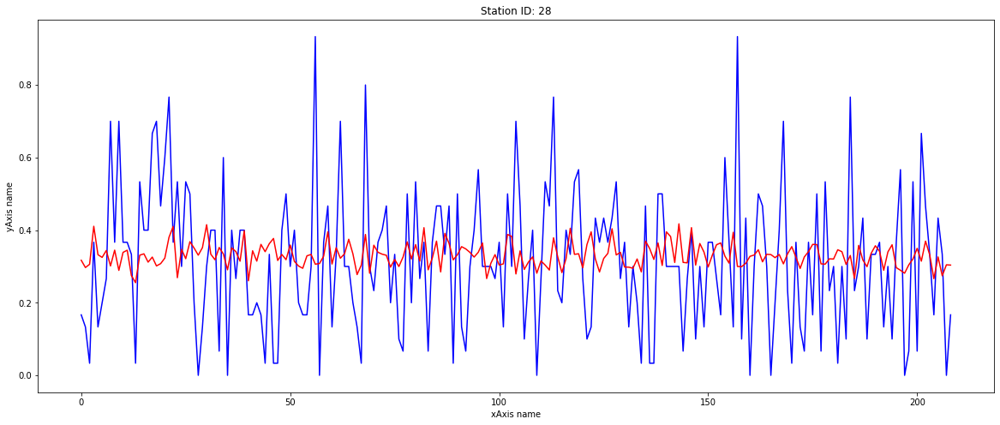

station ID:  37 

0.0904854981437293
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00169683  0.00335816 -0.02304397 -0.00756071]

Intercept: 
 2.504339857251358


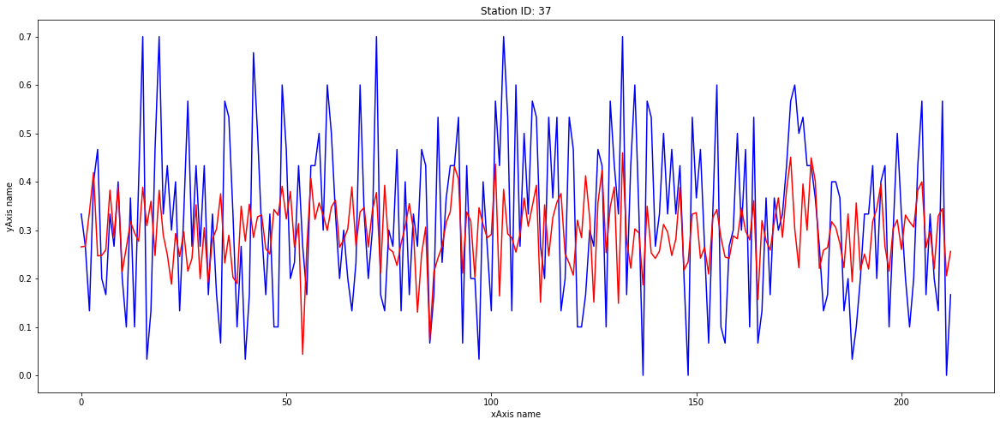

station ID:  78 

0.1378647921609416
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 2.24605661e-03 -4.57113396e-04 -2.40588519e-02  6.90694016e-05]

Intercept: 
 0.5353007766932308


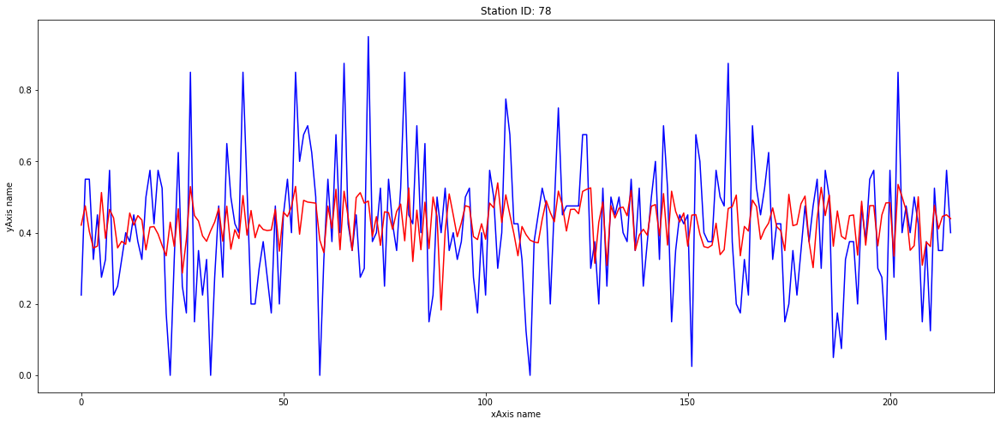

station ID:  49 

0.007105624712995695
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00682757 -0.00163989  0.00557237 -0.00659797]

Intercept: 
 2.2425691880123044


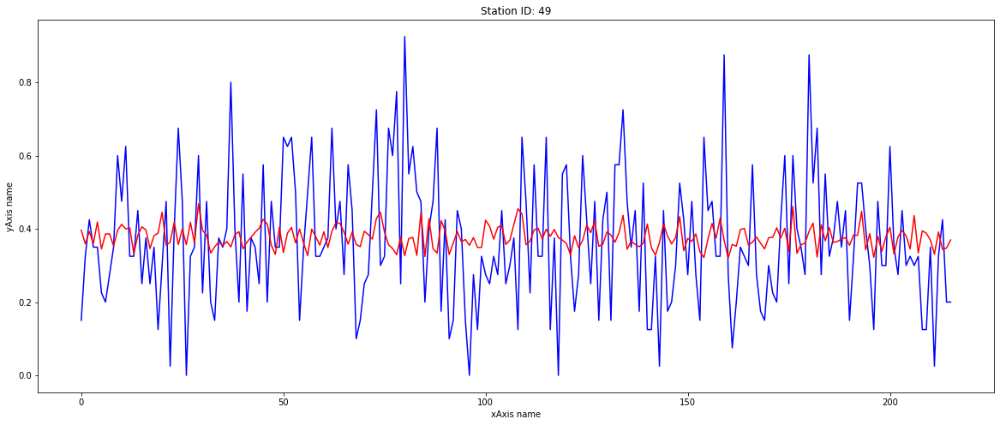

station ID:  74 

0.03882601381281503
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0141887  -0.00150963 -0.00779426 -0.01318892]

Intercept: 
 4.146637453273286


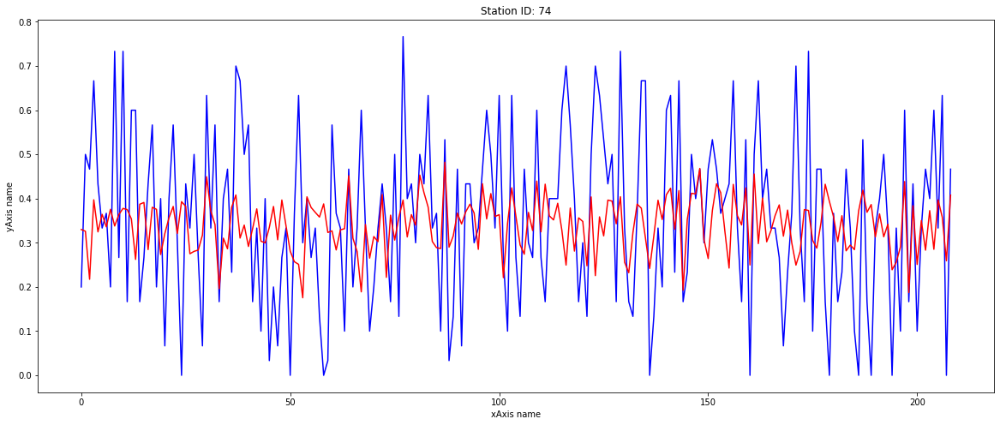

station ID:  115 

0.13055294922023486
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00433451 -0.00394183 -0.02092395 -0.01980627]

Intercept: 
 6.3758822893309794


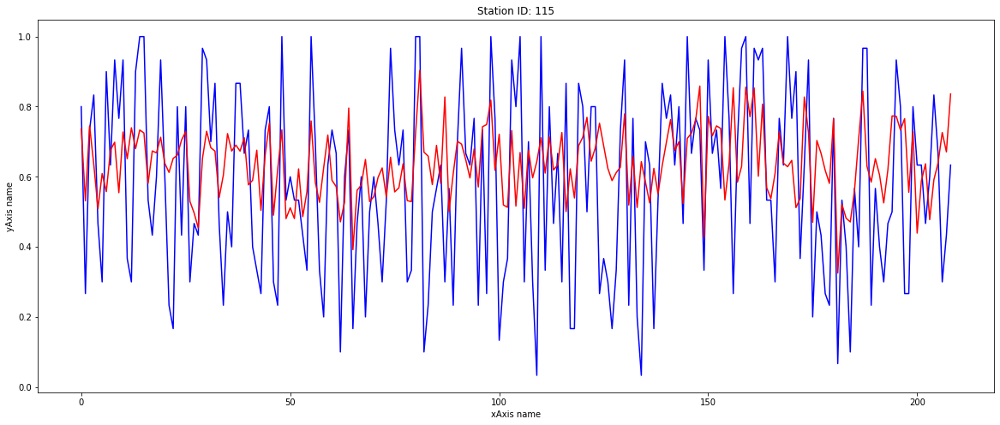

station ID:  116 

-0.00414944263250816
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00499193  0.002845    0.00150063 -0.00903959]

Intercept: 
 2.8071941521739263


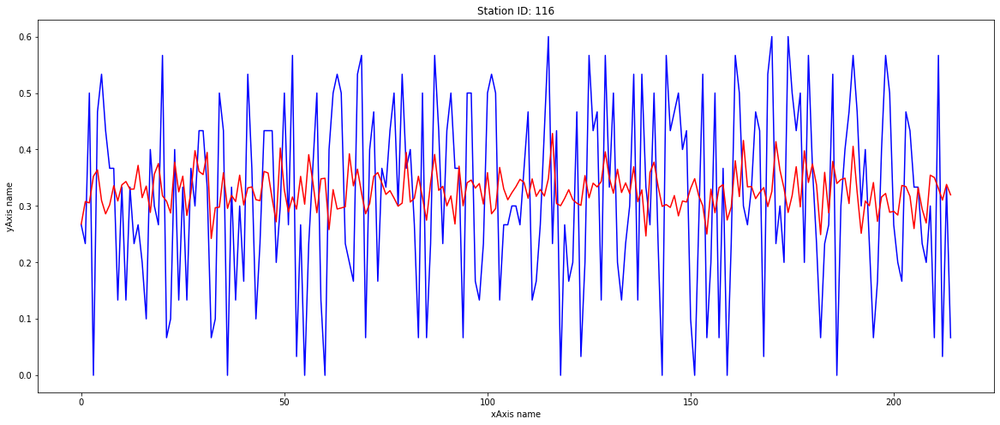

station ID:  44 

0.11187195439141107
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.02462973  0.00203093 -0.01497955 -0.02188143]

Intercept: 
 6.801468629931772


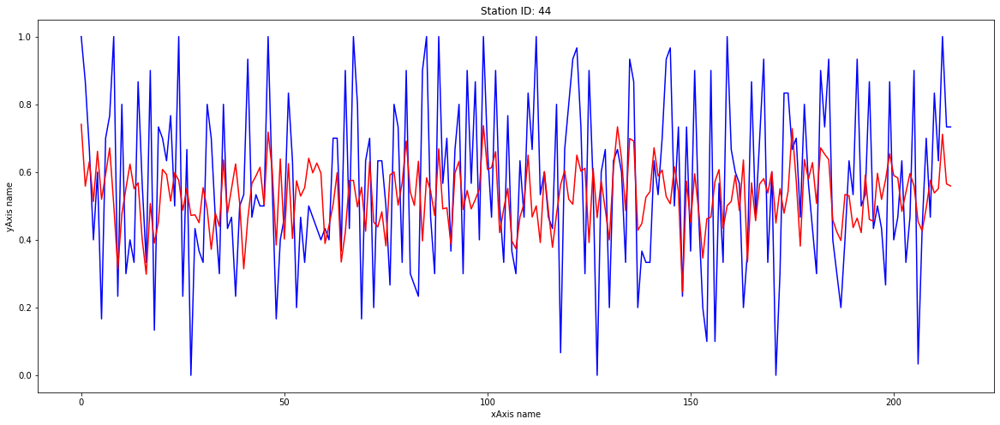

station ID:  27 

0.10283640513870362
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00198709  0.00421755  0.02049446  0.01052917]

Intercept: 
 -2.8769147925141505


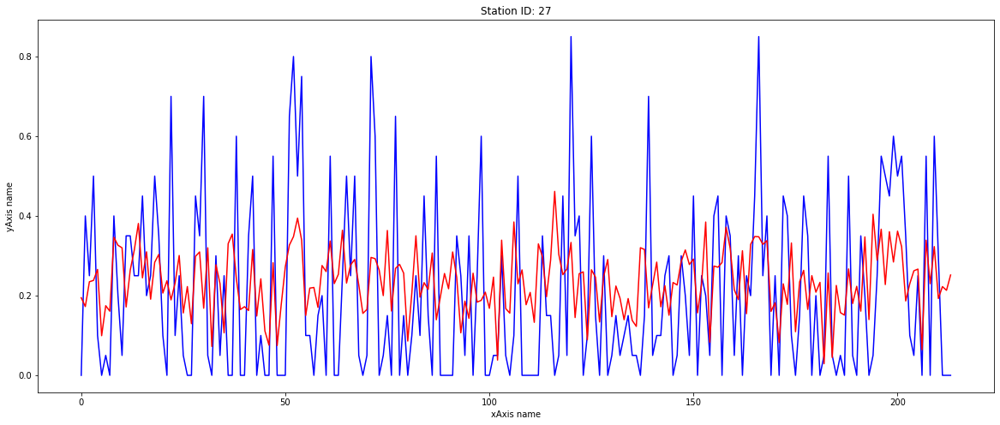

station ID:  91 

0.09227379575683026
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00461642 -0.00032006 -0.01468963 -0.01713606]

Intercept: 
 5.434748772413519


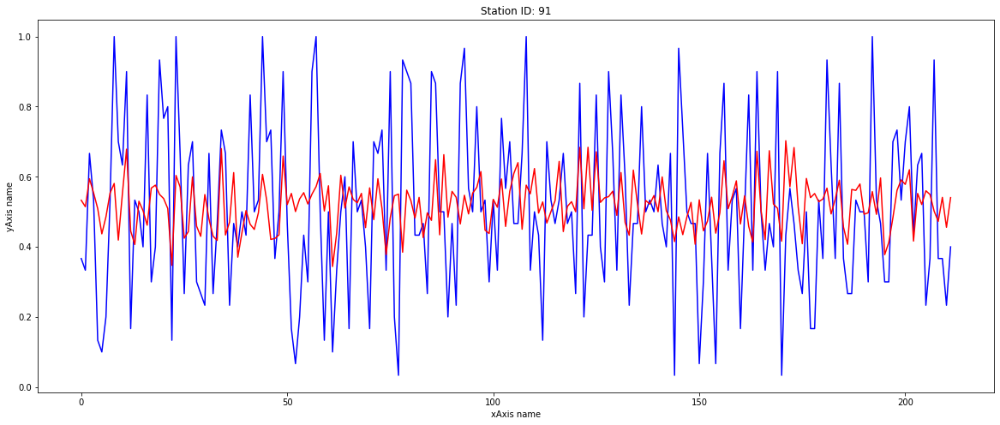

station ID:  113 

0.08611752977014686
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00805932  0.00078287 -0.00181215  0.00308281]

Intercept: 
 -0.6071558153897766


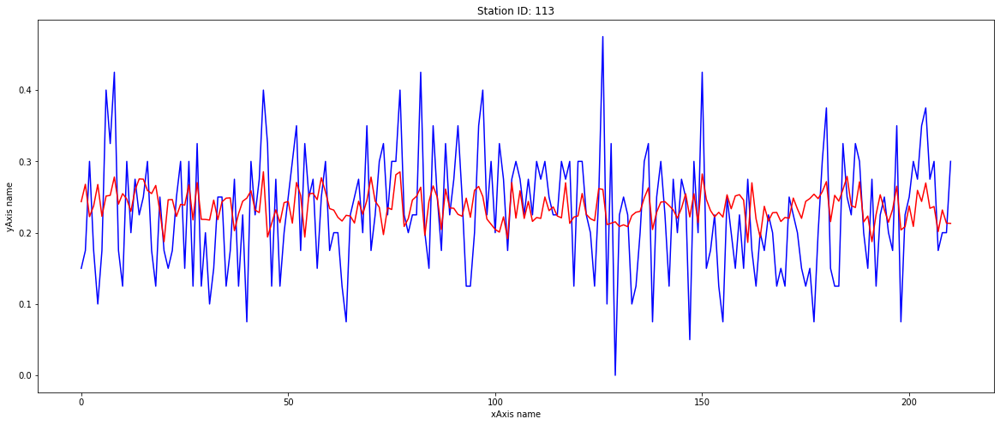

station ID:  23 

-0.0014488731753357076
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00233512  0.00137772 -0.00496283 -0.0046088 ]

Intercept: 
 1.6546605279613606


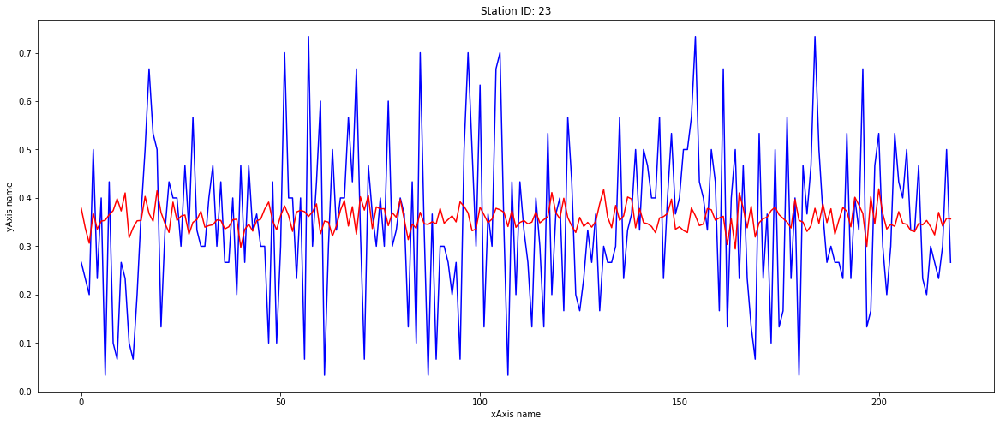

station ID:  114 

0.08416995698965013
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00922243  0.00134017 -0.00646519  0.00282855]

Intercept: 
 -0.5368915588979105


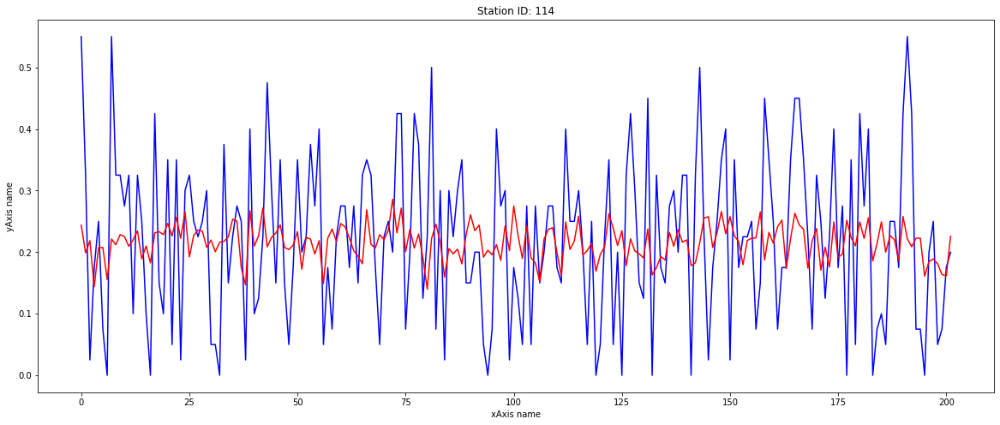

station ID:  6 

0.09110208432504519
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00195677  0.00443653  0.02259179 -0.00334462]

Intercept: 
 0.9271466379942396


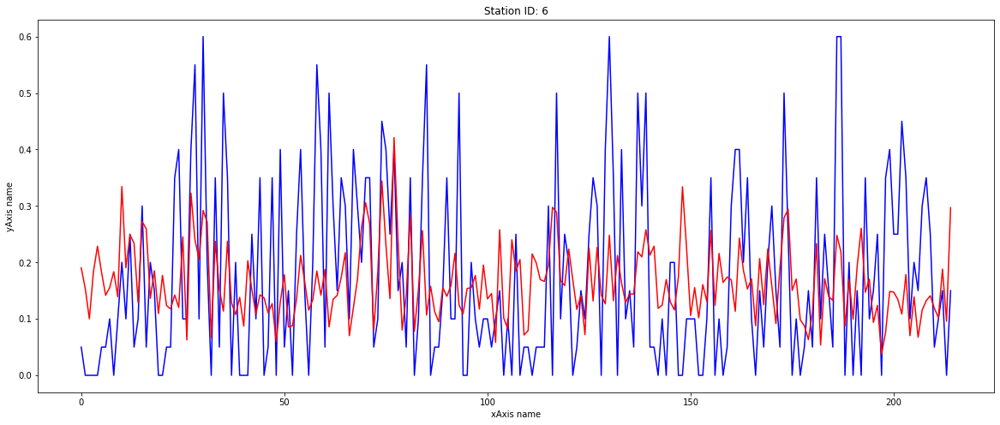

station ID:  31 

0.052352535291398494
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00756804  0.00339656 -0.00877215 -0.0223441 ]

Intercept: 
 6.817986969147355


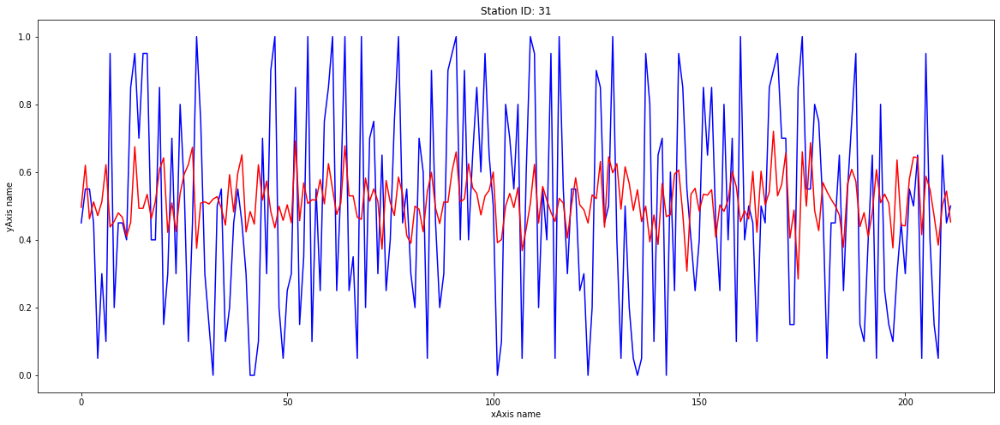

station ID:  43 

0.0013781882554172453
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01371972  0.00286866 -0.00514529 -0.00522555]

Intercept: 
 1.9488630510530656


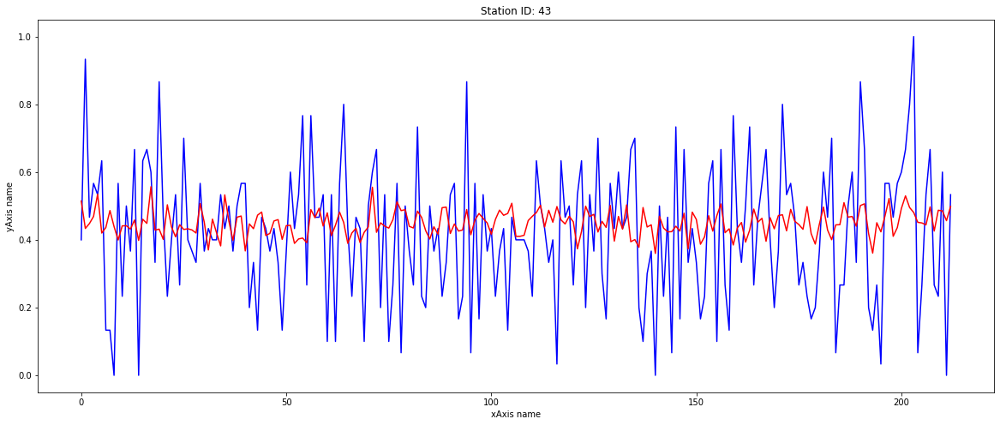

station ID:  112 

0.03784574170034127
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00443497 -0.00177635 -0.00628704 -0.02442121]

Intercept: 
 7.424320078395111


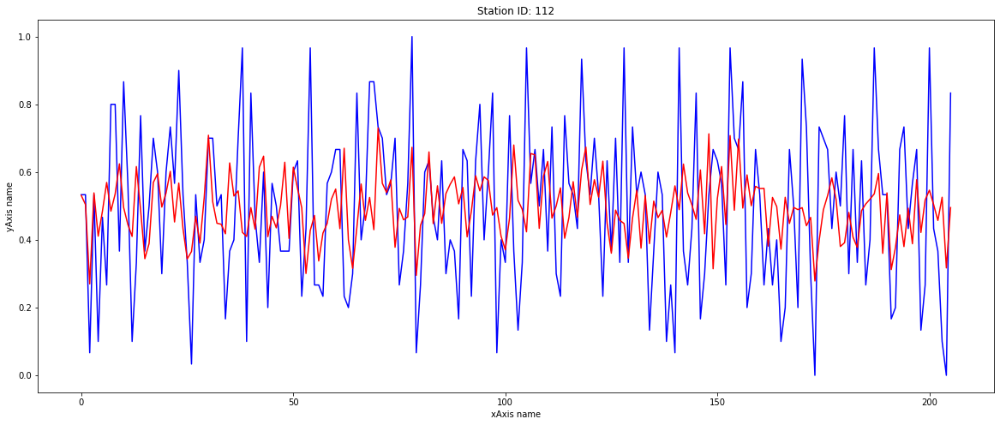

station ID:  30 

-0.003284734643496323
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [0.00953719 0.00127211 0.00863779 0.00171323]

Intercept: 
 -0.35843910723713457


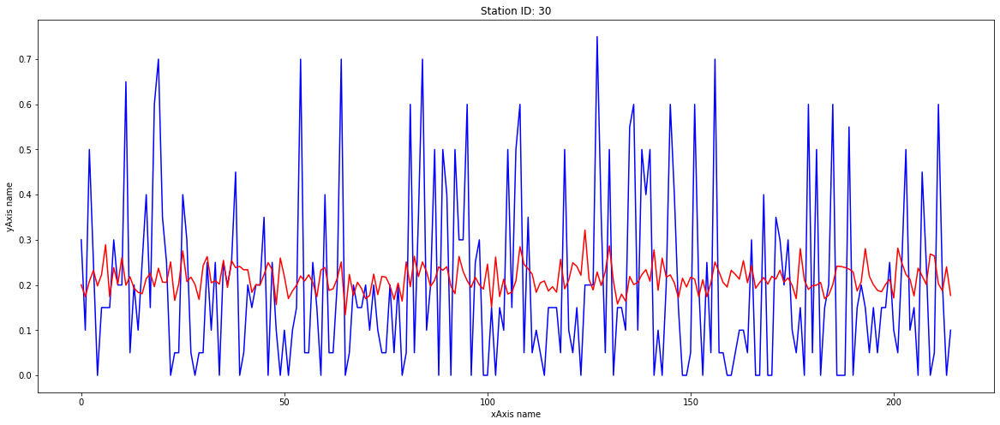

station ID:  71 

0.21836481670491426
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00570733  0.00246022  0.00597742 -0.02019135]

Intercept: 
 5.959335695803557


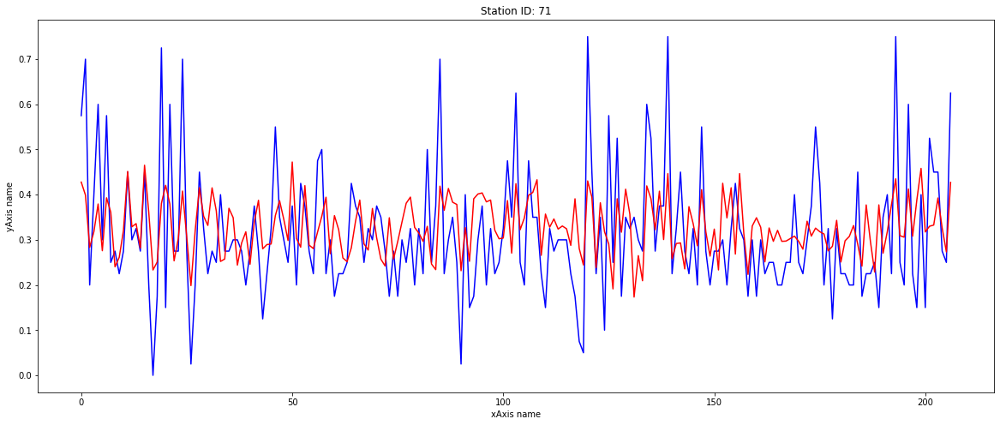

station ID:  97 

0.14642857529418174
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00410144  0.00219068 -0.01482408 -0.02014921]

Intercept: 
 6.25716519302001


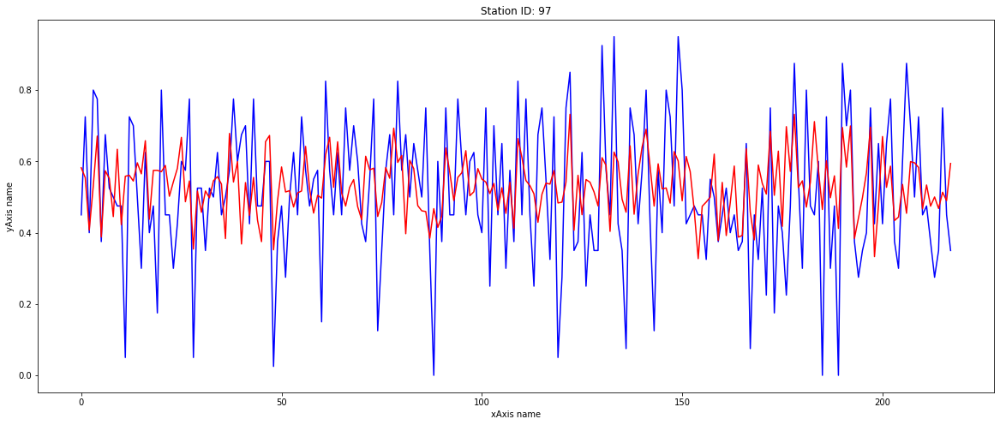

station ID:  83 

0.12802508209214014
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01401213  0.00103443 -0.02144032 -0.01175875]

Intercept: 
 3.8707584280858356


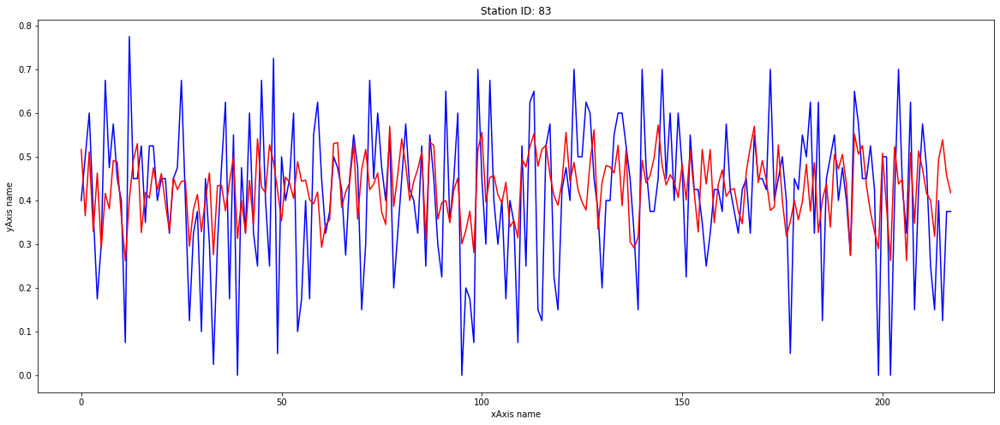

station ID:  50 

0.16205189347818294
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00550509  0.00071897 -0.01924578 -0.01653827]

Intercept: 
 5.112905945474316


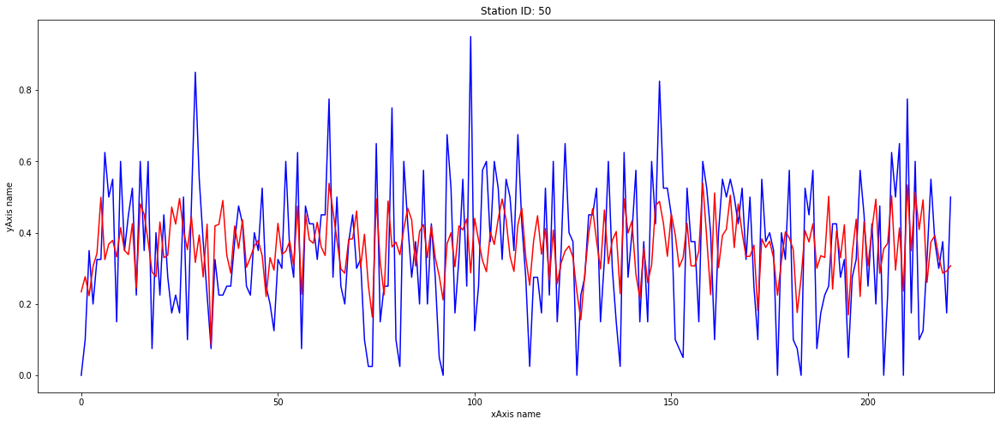

station ID:  109 

0.08581386226511623
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.0076784  -0.0031501  -0.01882739 -0.00588131]

Intercept: 
 2.144593996280196


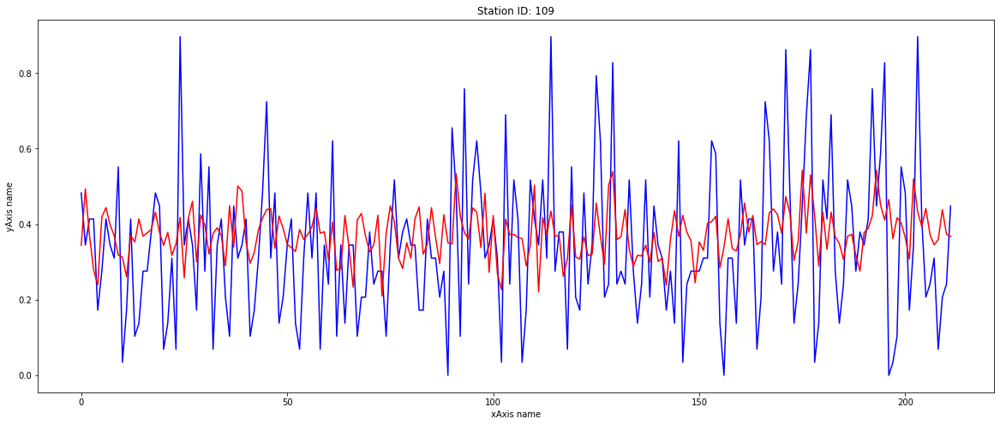

station ID:  19 

-0.010379159720309561
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00250195  0.00243595 -0.00570183  0.00576395]

Intercept: 
 -1.3171930773593694


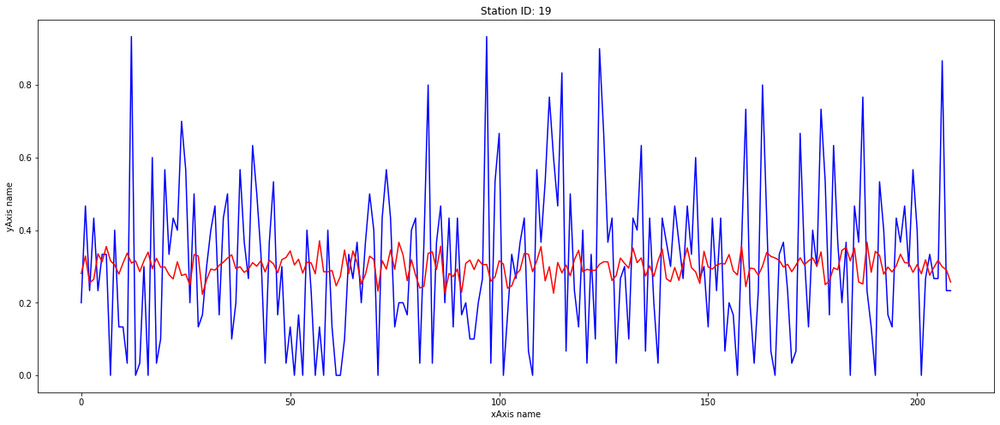

station ID:  8 

0.00014308636512272432
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00934771  0.00012763 -0.00183609  0.00109591]

Intercept: 
 0.011210366086264467


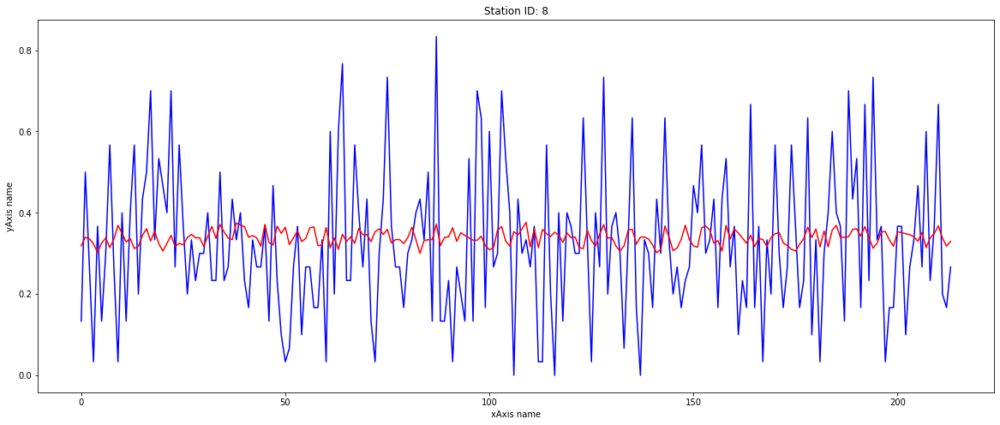

station ID:  2 

0.06530355129492882
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01224533 -0.00131325 -0.00511267 -0.0033923 ]

Intercept: 
 1.3678441772369474


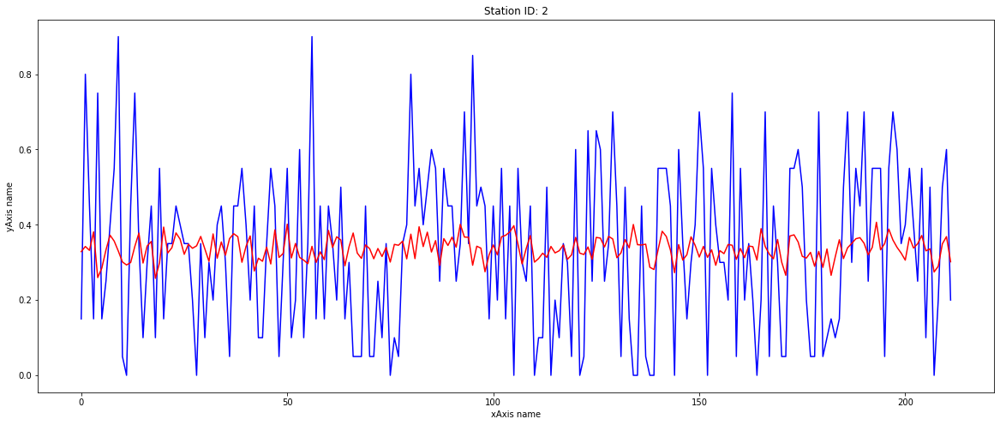

station ID:  94 

-0.0007765685751188744
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00470525 -0.00083945 -0.00573574 -0.00242724]

Intercept: 
 0.8618176483773


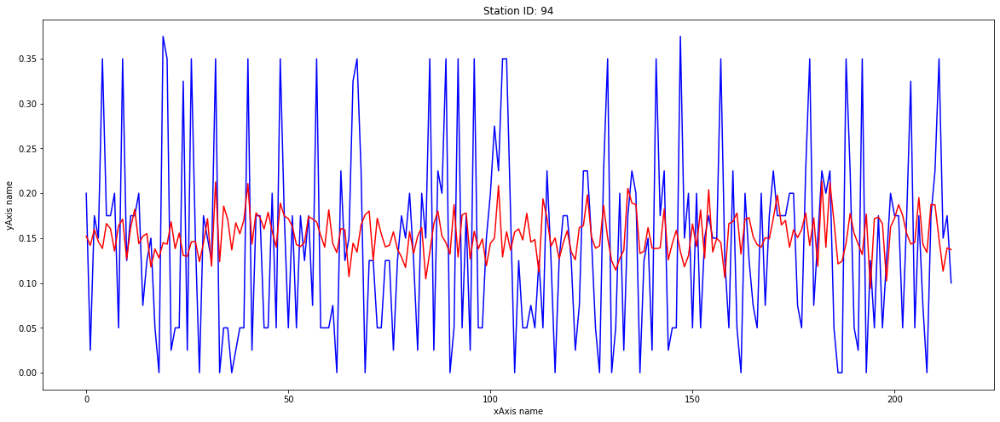

station ID:  41 

0.02579996336989121
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.01314388  0.0007667  -0.00373242 -0.00136874]

Intercept: 
 0.6814490751296685


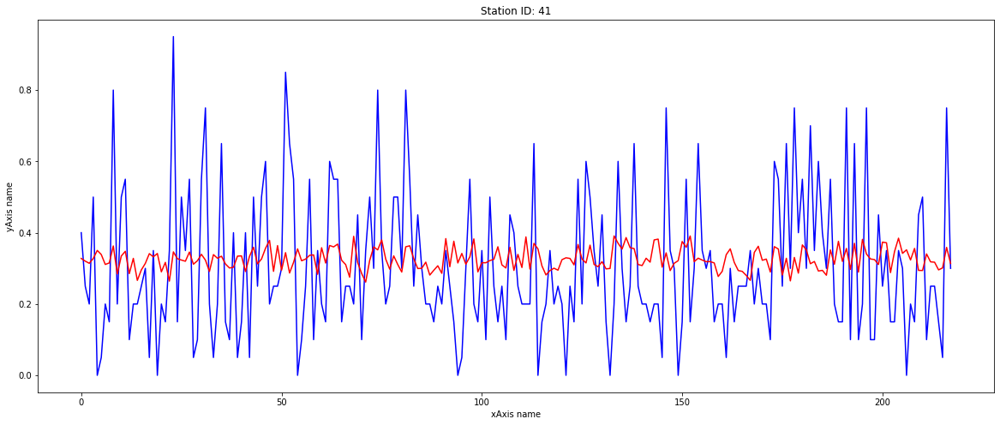

station ID:  80 

-0.005461371686136918
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00732303  0.00105375  0.00390243  0.00122641]

Intercept: 
 -0.062036758759112076


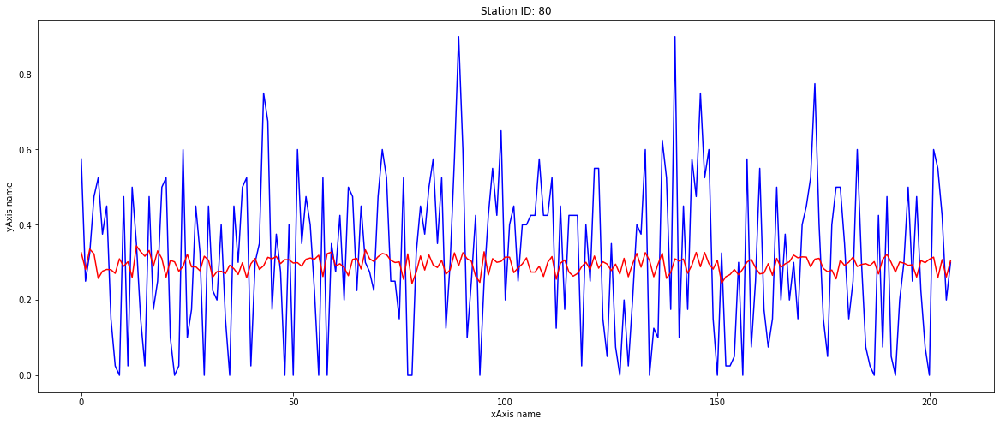

station ID:  11 

0.01659920778661117
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00640084 -0.00011544  0.00402347  0.00595075]

Intercept: 
 -1.3991619928533523


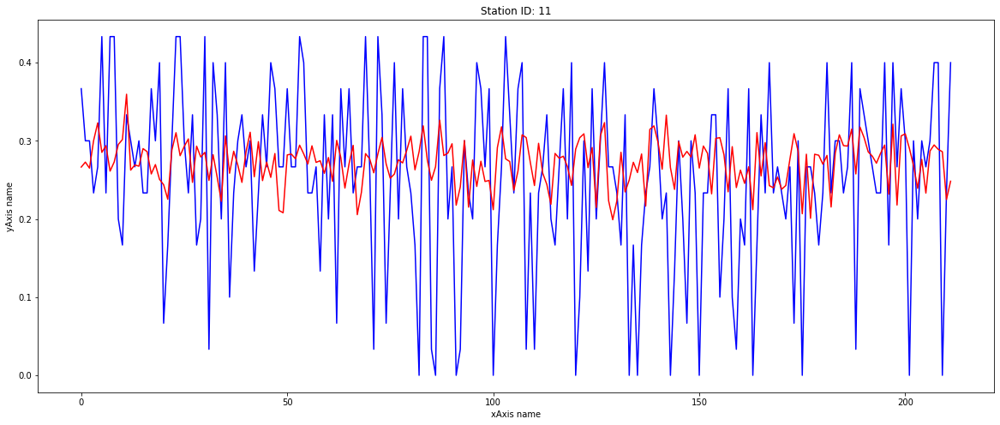

station ID:  42 

0.17589861388838846
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01073698 -0.00075744 -0.03979339 -0.00899005]

Intercept: 
 3.3647535953729433


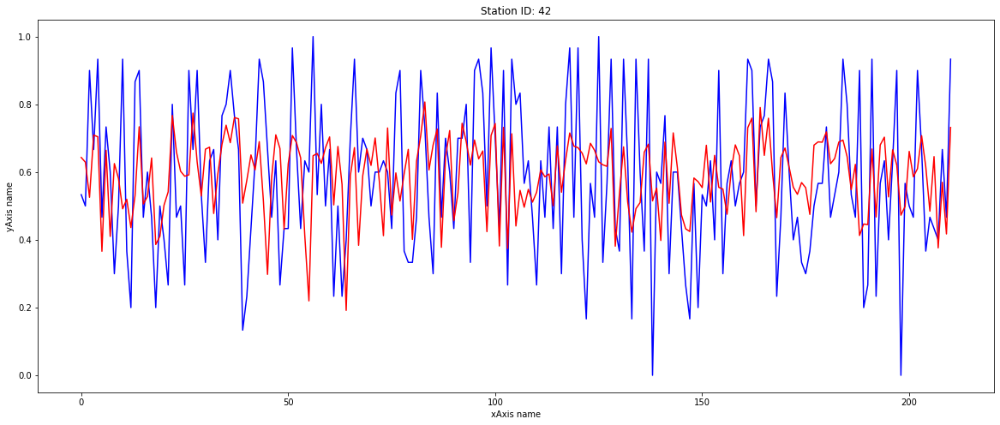

station ID:  17 

0.050527962626964906
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00977814  0.00123378 -0.00890719  0.00777517]

Intercept: 
 -1.8388023657791956


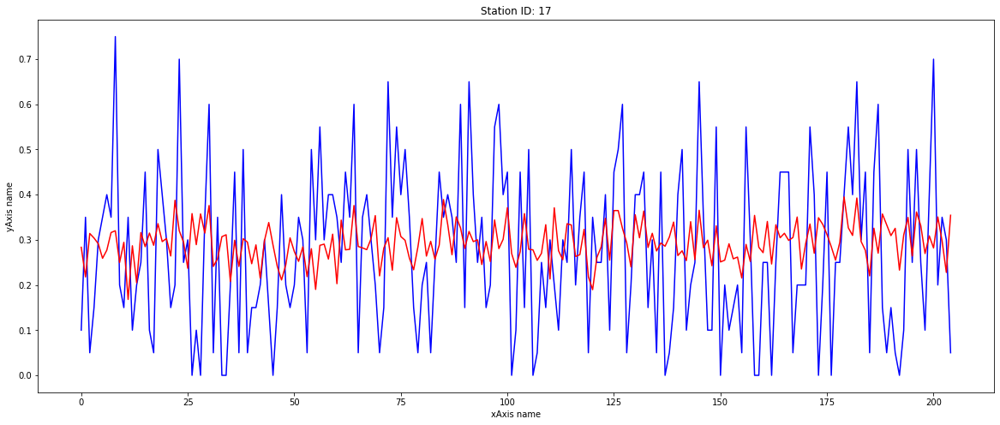

station ID:  75 

0.13682328801751598
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00206106  0.0003539  -0.00731166 -0.01737991]

Intercept: 
 5.255787227760857


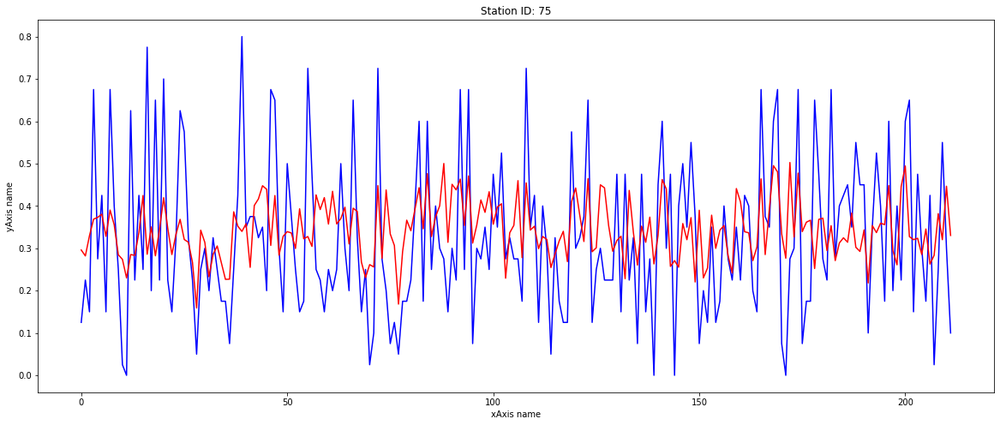

station ID:  40 

-0.006316284634240832
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00698273  0.00535598 -0.01898837  0.00125159]

Intercept: 
 0.14647346146824547


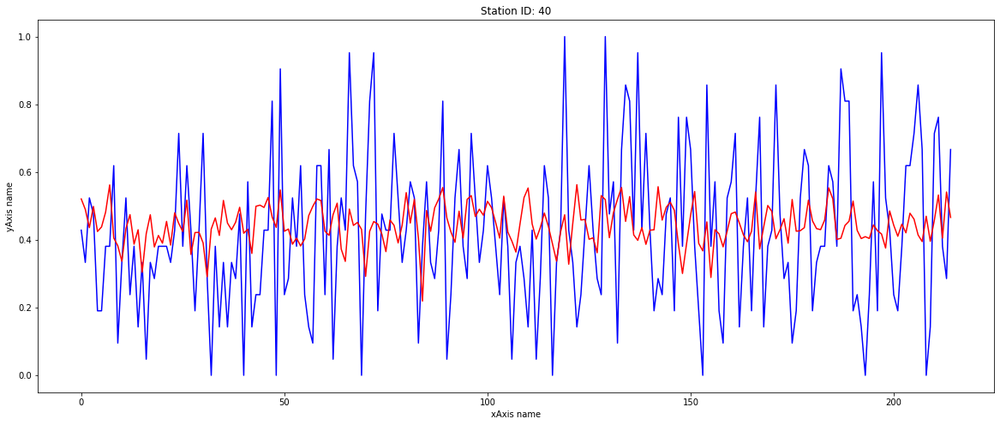

station ID:  104 

0.09637034955518353
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00523532  0.00214256 -0.00759011 -0.01079452]

Intercept: 
 3.2971535930278315


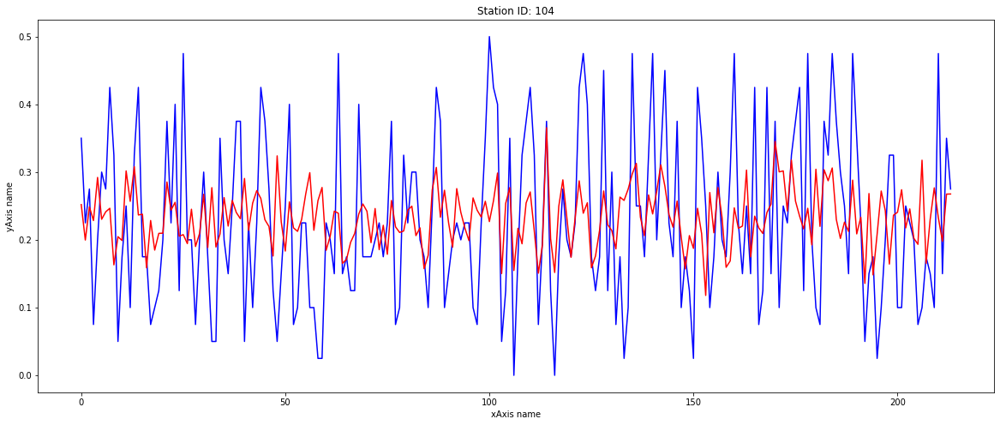

station ID:  102 

0.09522157798864495
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00721759  0.00080447  0.01873598 -0.01102307]

Intercept: 
 3.259584811759218


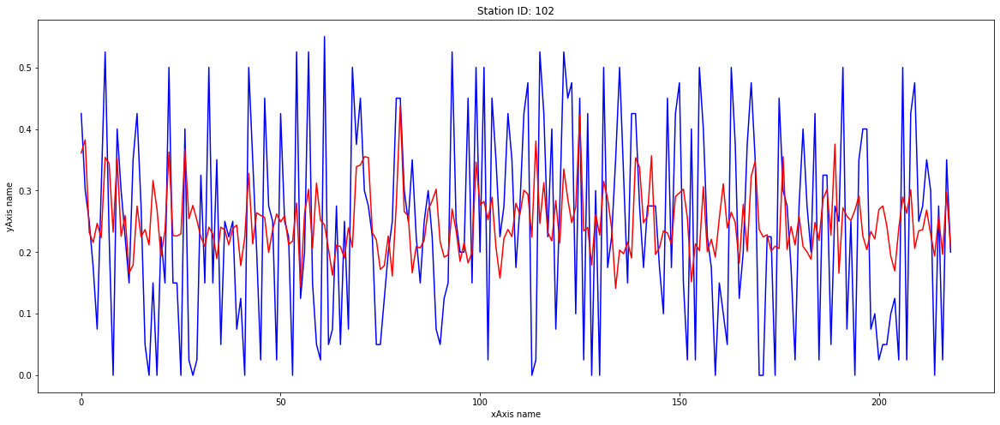

station ID:  5 

0.05008106251185396
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00222118  0.00113718  0.00659453 -0.01363985]

Intercept: 
 4.143557079966948


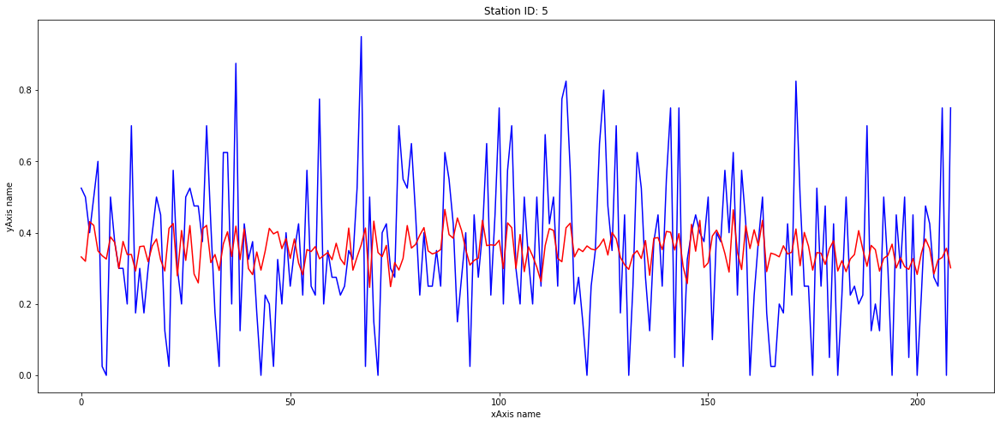

station ID:  26 

0.08400546706936662
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.01040638 -0.00200753 -0.01799998  0.01775228]

Intercept: 
 -4.407033283629199


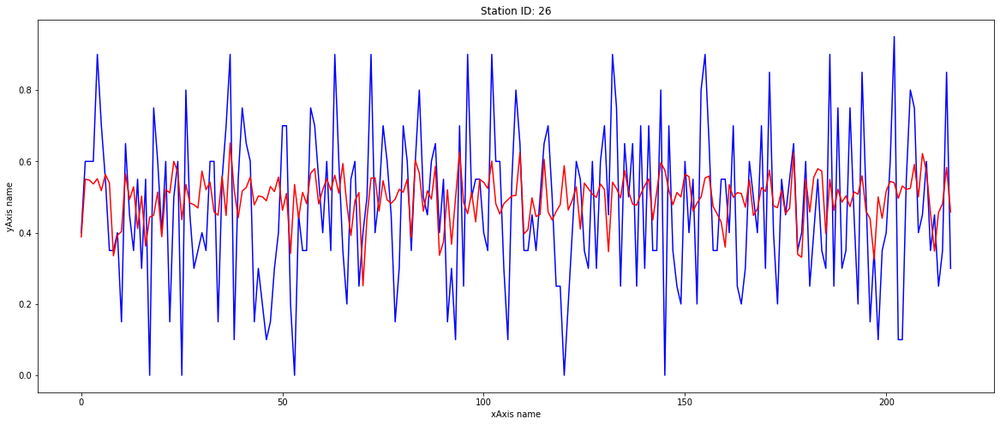

station ID:  108 

0.0329544434993283
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 4.77060502e-03  1.91791597e-05 -9.39768150e-03 -8.91749127e-03]

Intercept: 
 2.8502444352509118


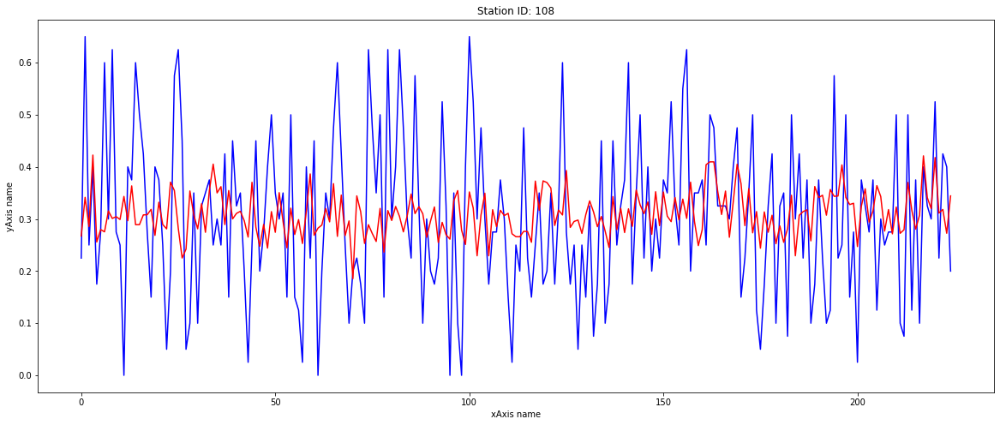

station ID:  98 

0.021953837177003055
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00292747  0.0012235   0.00850985 -0.00550768]

Intercept: 
 1.6098535490479604


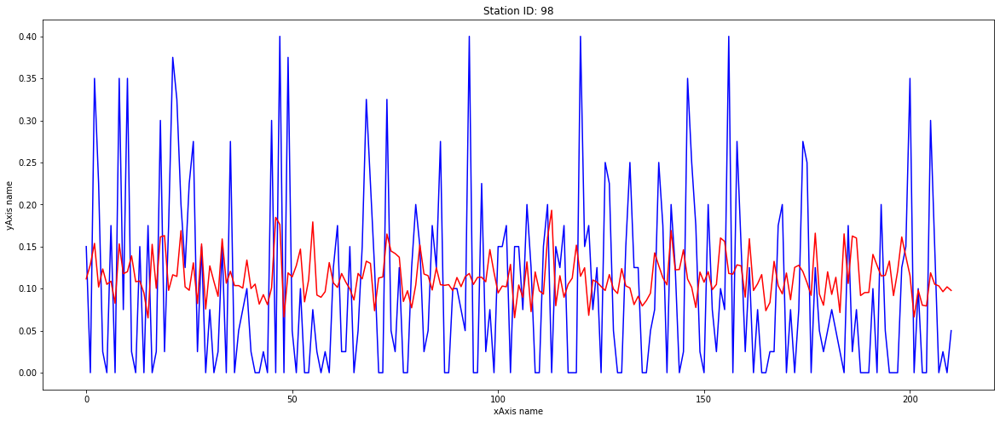

station ID:  110 

0.025280151796599926
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00805559 -0.00116897 -0.00939034  0.00045334]

Intercept: 
 0.24163231825368725


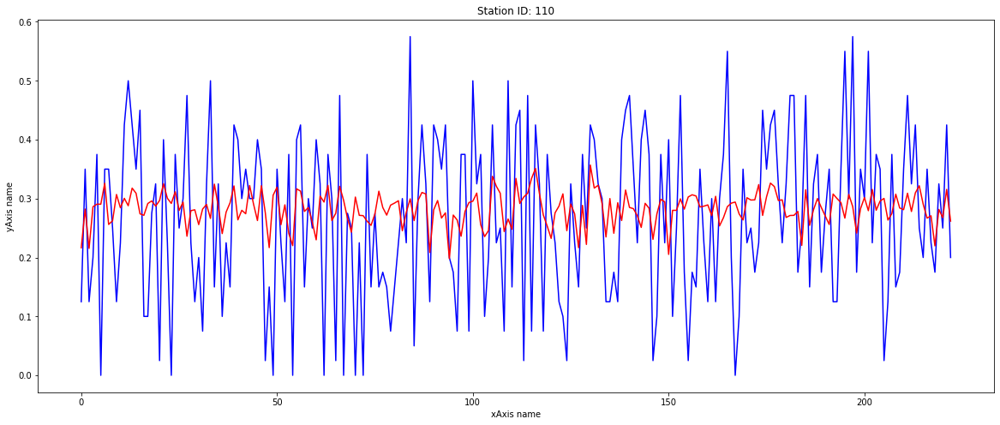

station ID:  73 

0.15098990653223154
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00201184 -0.0010869  -0.01000511 -0.01751121]

Intercept: 
 5.344767892261407


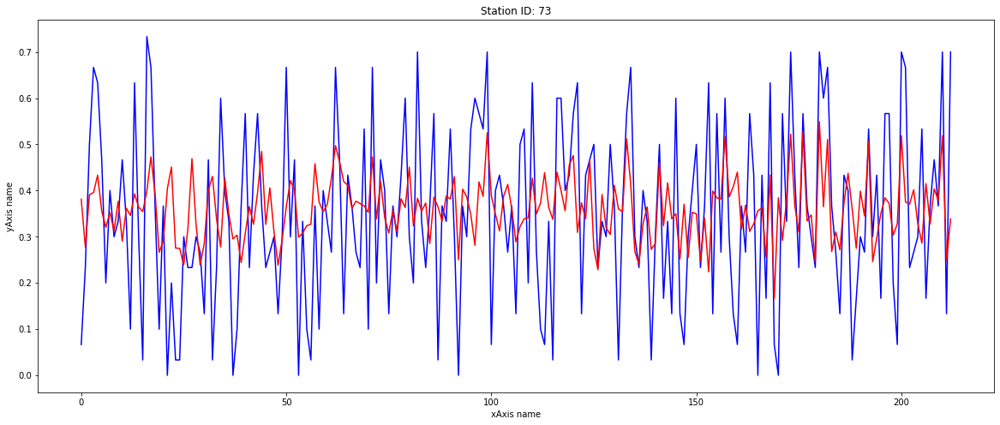

station ID:  52 

0.03452539695822954
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.03304048  0.00036454 -0.00531272  0.01596113]

Intercept: 
 -4.250020223478622


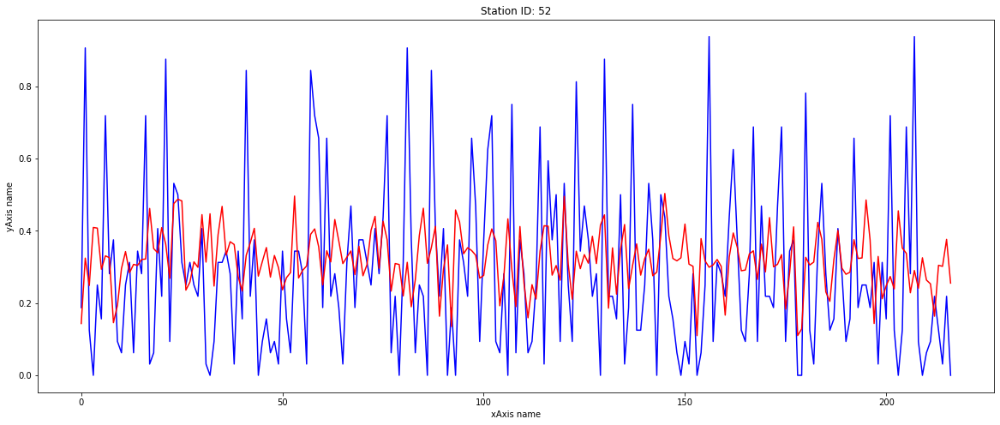

station ID:  55 

0.11370364883890638
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00084078 -0.00146368  0.00379171  0.00718558]

Intercept: 
 -1.8022449856358767


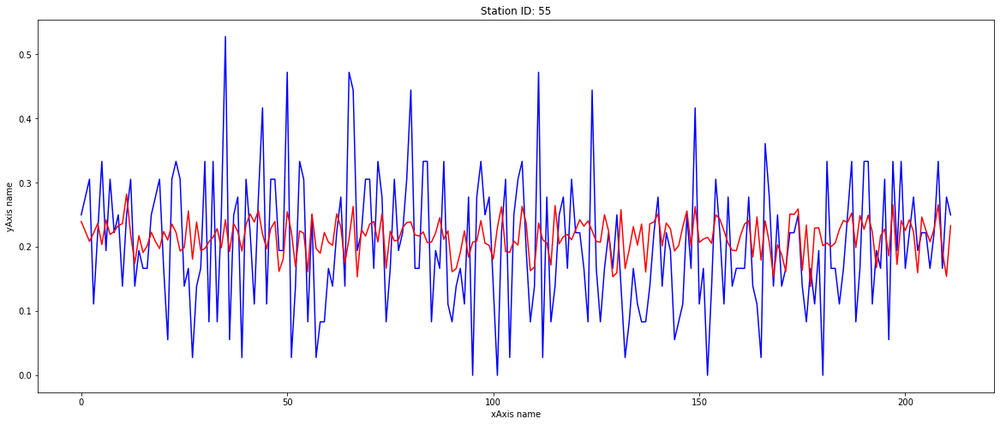

station ID:  7 

-0.016725338308044124
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00714596  0.00180315 -0.00288952 -0.00867861]

Intercept: 
 2.7222221041305157


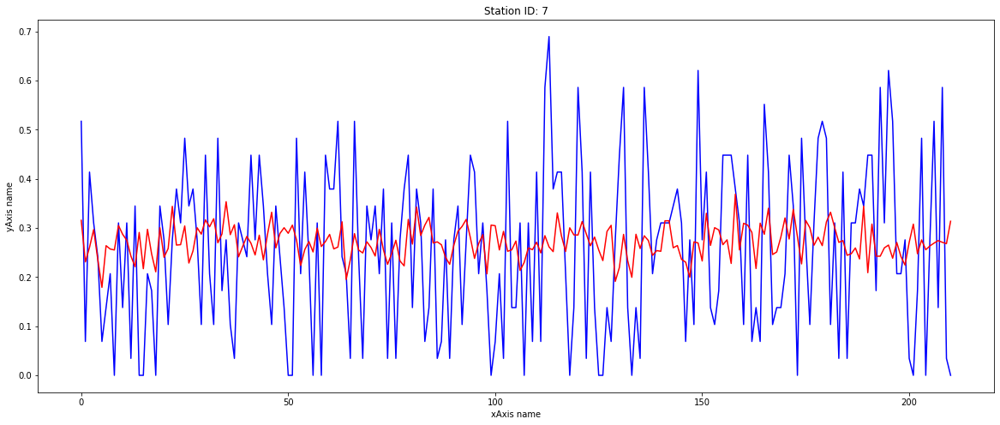

station ID:  76 

0.17781362886374552
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00602705  0.0010911  -0.01645107 -0.01251956]

Intercept: 
 3.9362660014998276


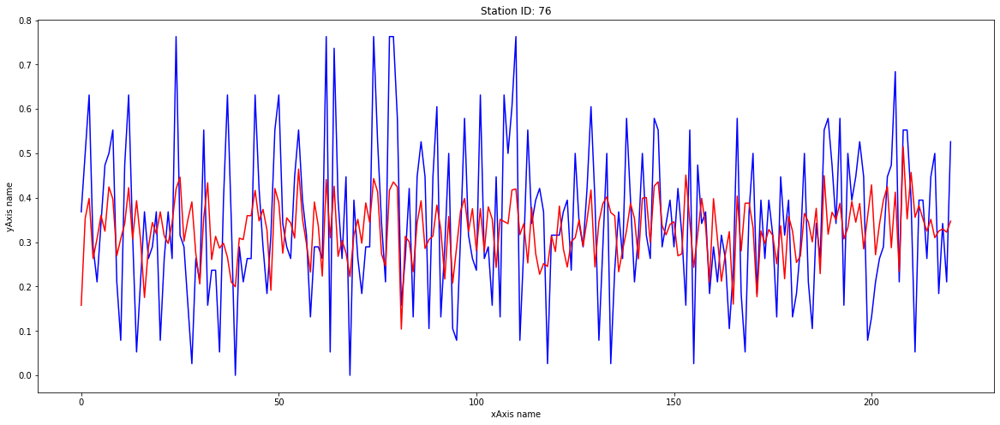

station ID:  67 

0.07232055634974399
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0216378  -0.00143614  0.00477313 -0.01336712]

Intercept: 
 4.224877417870654


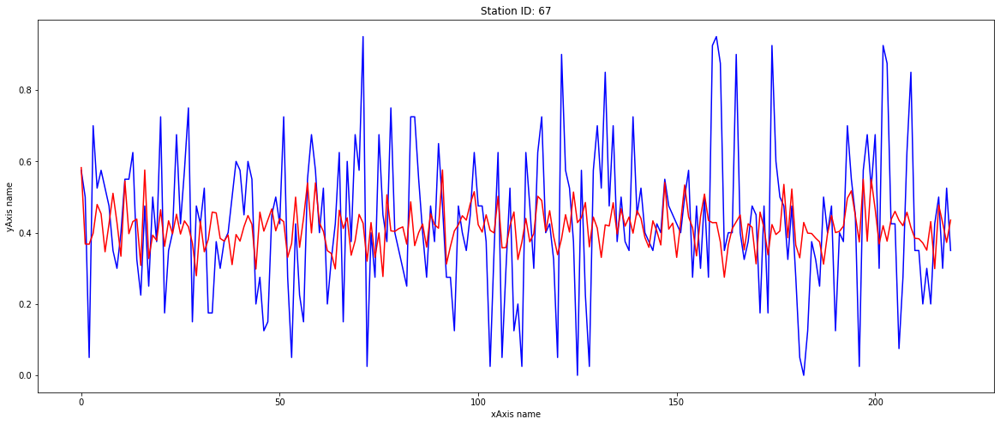

station ID:  111 

-0.006299167260253258
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00055466 -0.00119088  0.00155582 -0.00300211]

Intercept: 
 1.1109790654376064


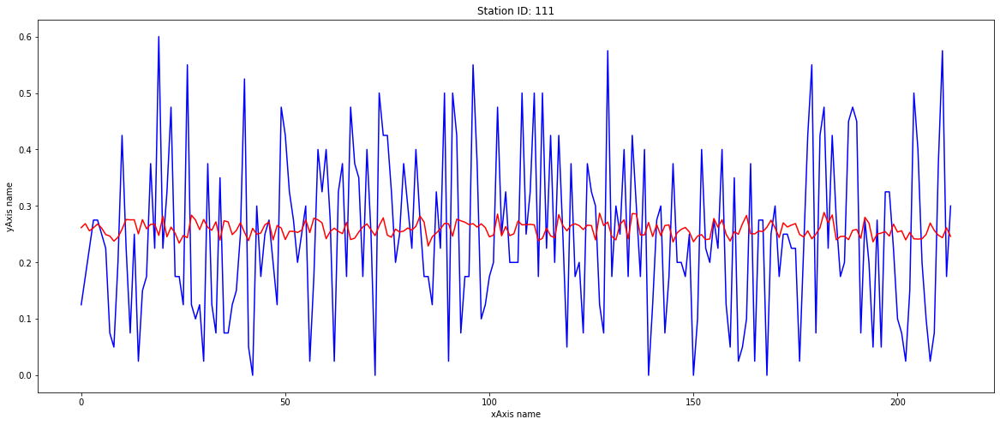

station ID:  96 

0.1494741619718467
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00910264  0.00058373 -0.00027724 -0.01607932]

Intercept: 
 4.955719213004539


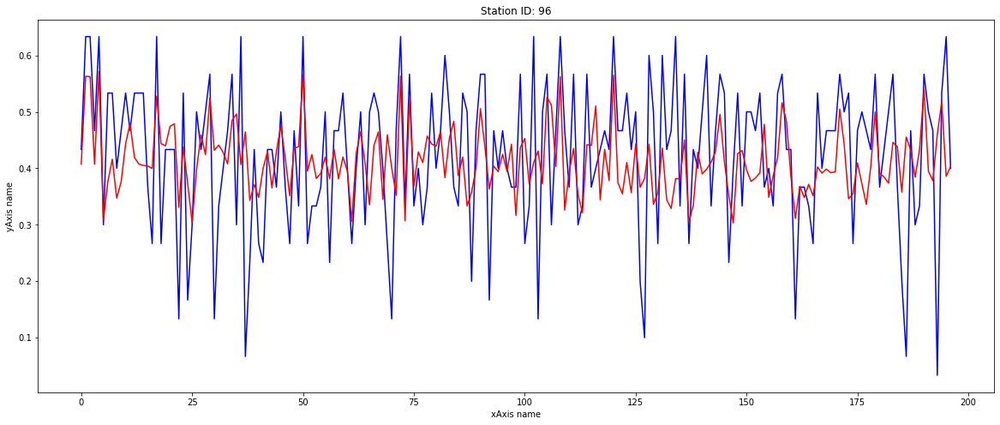

station ID:  51 

0.00296155014887578
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00492775 -0.00022356 -0.00289057  0.00190606]

Intercept: 
 -0.3589204946990763


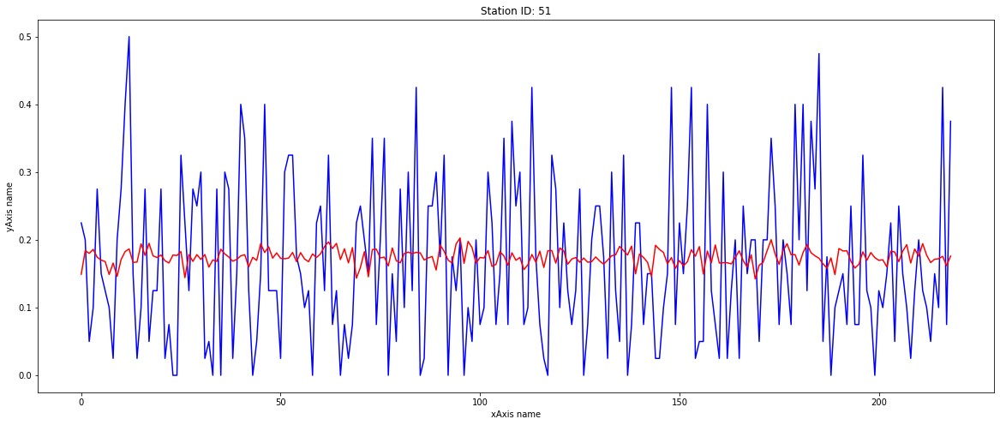

station ID:  9 

0.059087732611917354
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [0.00341355 0.00036988 0.01333251 0.00690766]

Intercept: 
 -1.7411752972809404


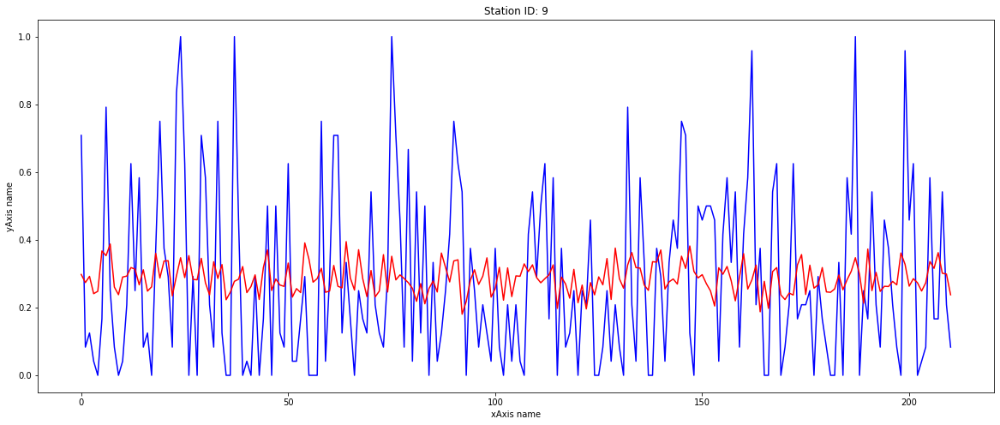

station ID:  72 

0.06857325254014524
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01433657 -0.00206405  0.00103495 -0.02141556]

Intercept: 
 6.517129513616169


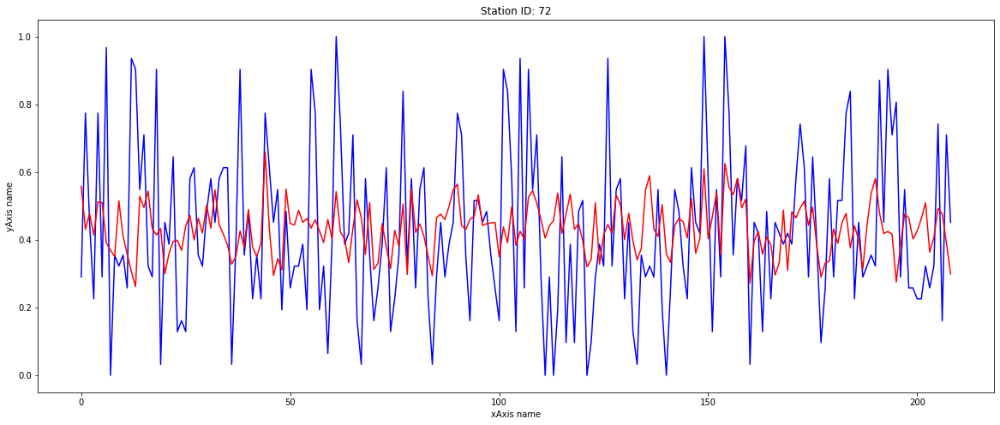

station ID:  99 

0.12857087495523645
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.03221461  0.00212348 -0.00117523 -0.00532322]

Intercept: 
 1.8456526700361295


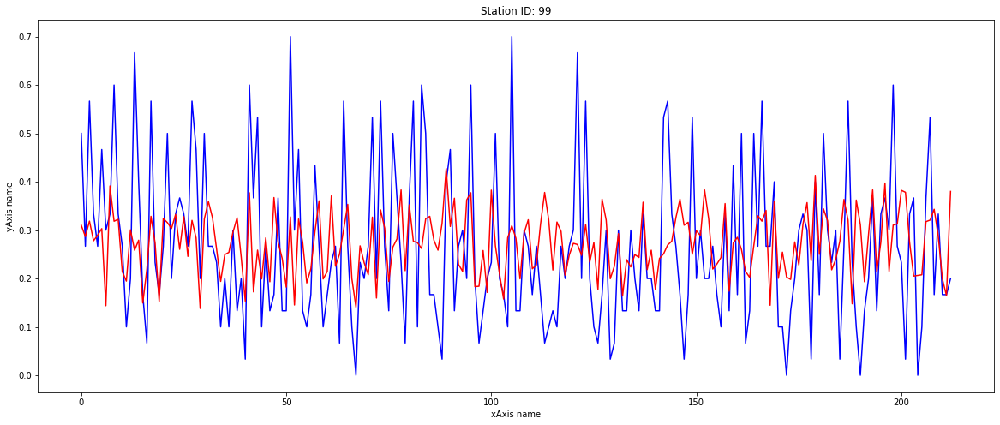

station ID:  107 

0.03085395873507646
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01226483  0.00226846  0.00537464 -0.00697427]

Intercept: 
 2.257429866748548


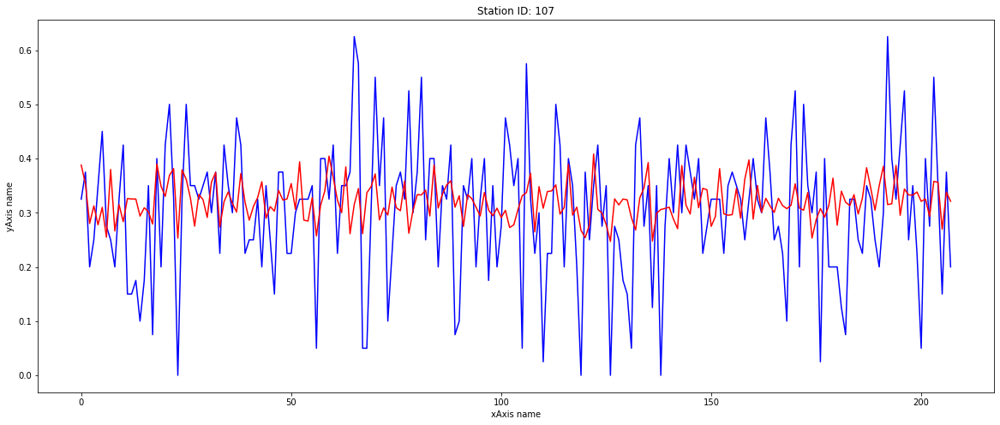

station ID:  63 

-0.0007545473088954591
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00193122 -0.00119013  0.00562545  0.00389866]

Intercept: 
 -0.8598097888608974


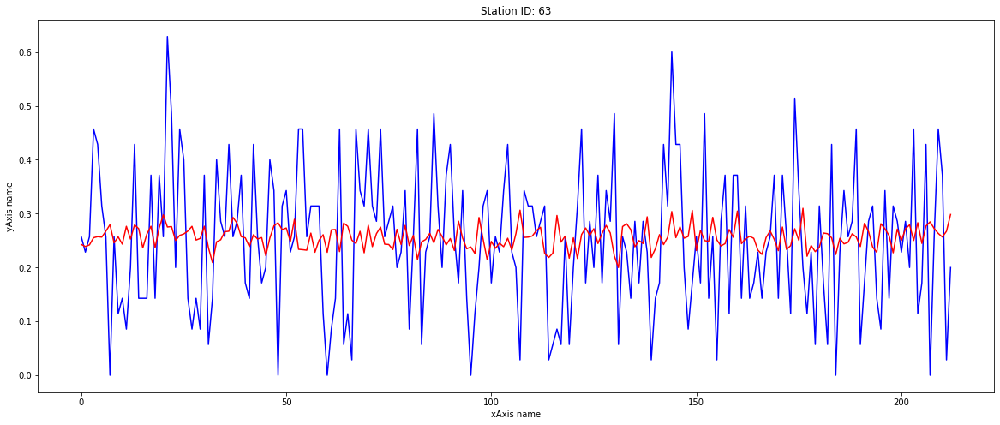

station ID:  117 

0.05513530973022929
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00617133  0.0008556   0.00433138 -0.00117613]

Intercept: 
 0.39440314143792693


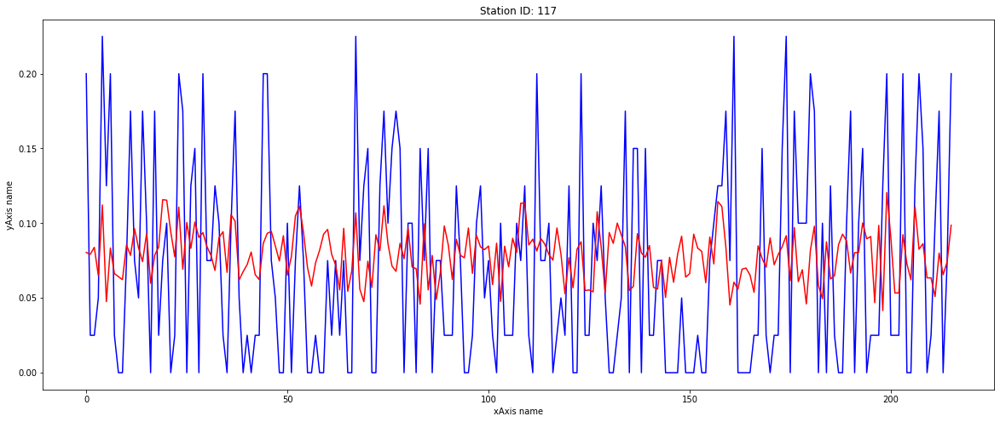

station ID:  18 

-0.010759194850420206
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00803423 -0.00097672  0.00482327 -0.00542776]

Intercept: 
 1.9361580004996795


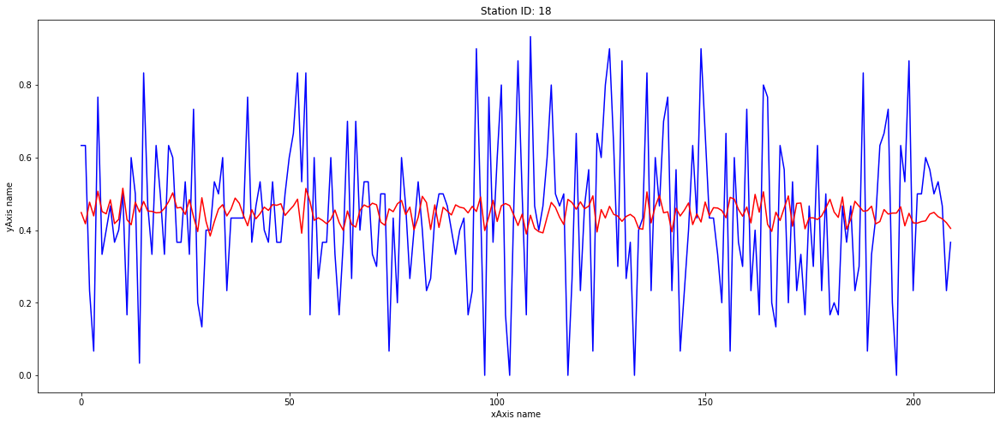

station ID:  59 

0.006097050052772945
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01930899  0.00236658  0.01392827 -0.00659155]

Intercept: 
 2.1561676156792355


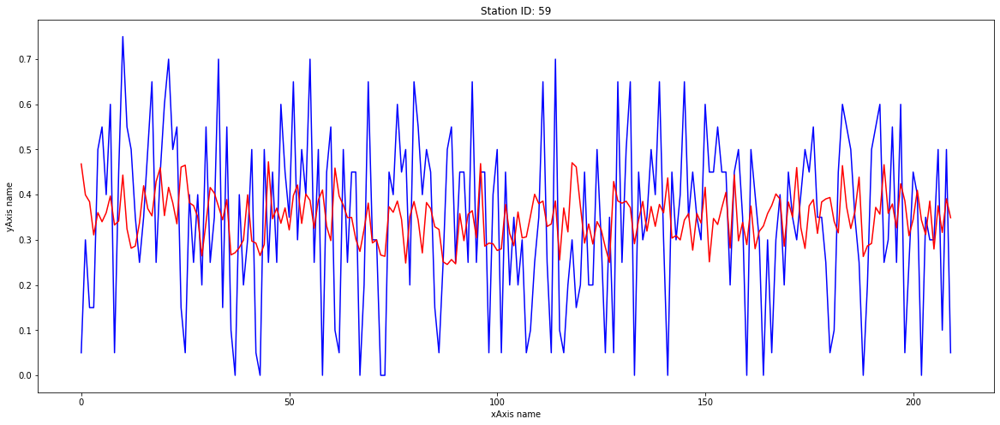

station ID:  77 

0.001080276427852911
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00857948 -0.00111739 -0.00300239 -0.00923049]

Intercept: 
 2.910774755231798


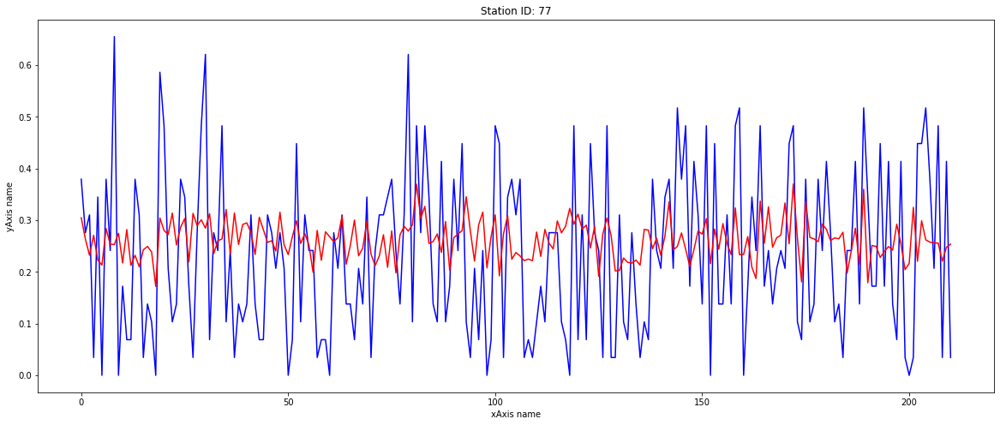

station ID:  36 

0.09573088464069635
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0093168   0.0012739   0.00897856 -0.00025944]

Intercept: 
 0.2826567230495899


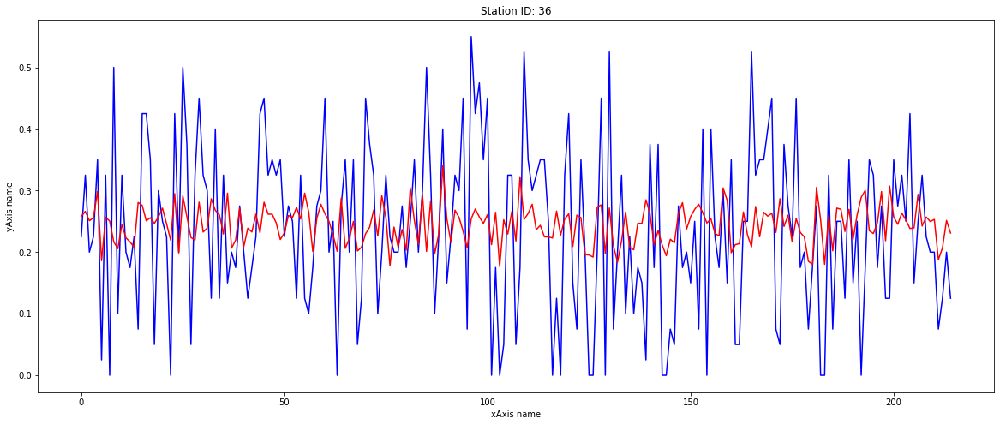

station ID:  62 

-0.015952890765648542
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00204119 -0.00095773  0.00473514 -0.00057529]

Intercept: 
 0.29201138481215017


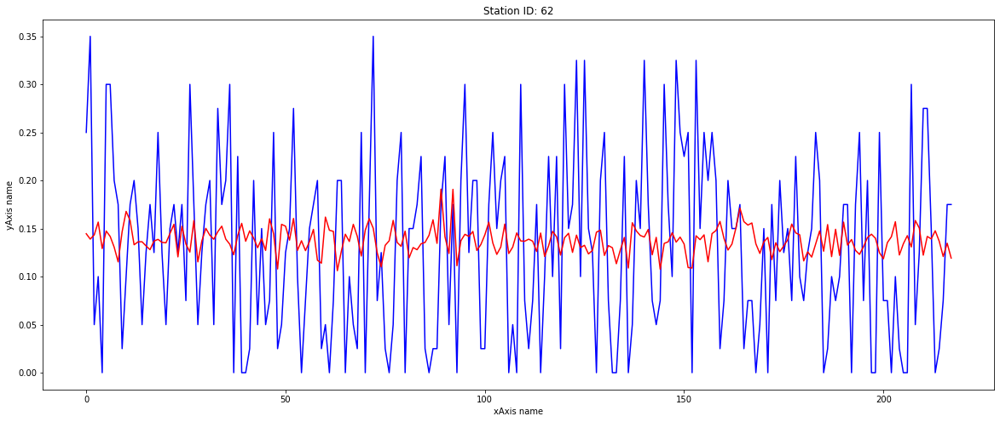

station ID:  33 

-0.005927786861312345
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00415569  0.00172285  0.00073295 -0.00395262]

Intercept: 
 1.6187294578535147


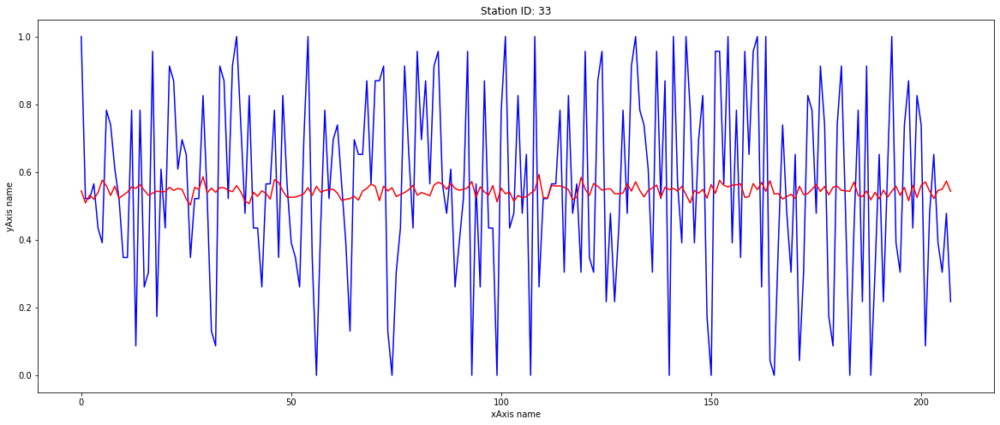

station ID:  57 

0.18581496271357245
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-2.08055580e-02  4.17406602e-05  2.80615121e-02 -1.42900003e-02]

Intercept: 
 4.257338150676281


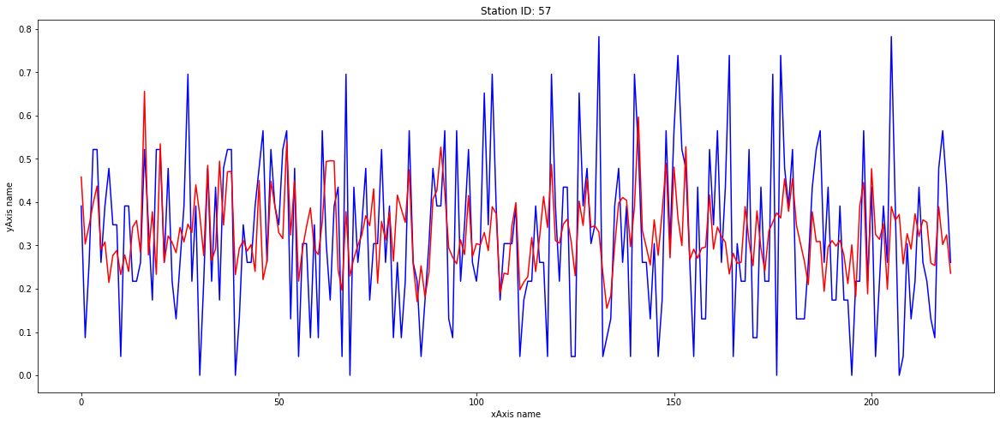

station ID:  38 

0.020206351578626713
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00338864  0.00209174 -0.00513222 -0.00652713]

Intercept: 
 2.2789278209890393


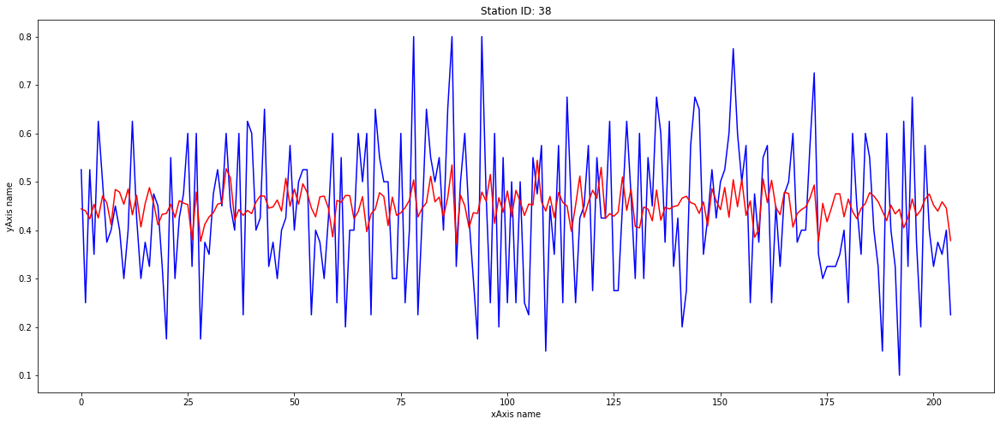

station ID:  65 

0.018263387976434897
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.0071143   0.00110785 -0.00528685 -0.00485616]

Intercept: 
 1.621209245164236


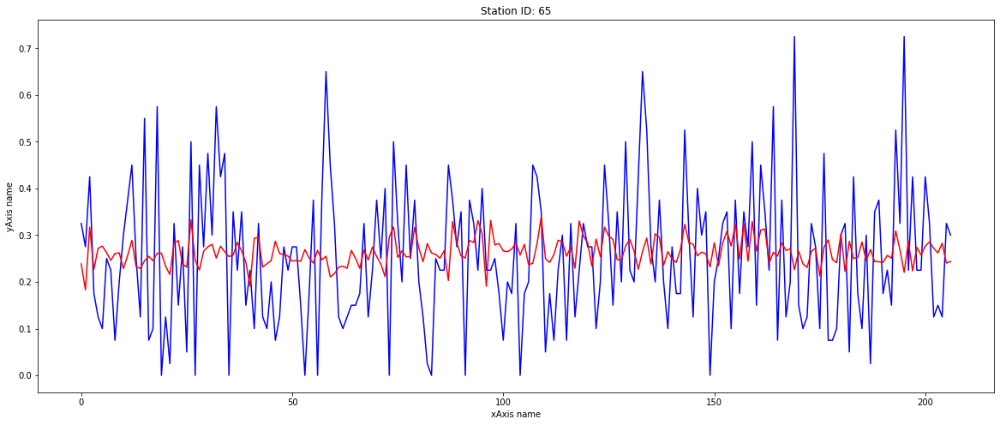

station ID:  84 

0.09560596757685469
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00566483 -0.00094319 -0.0093521  -0.01075581]

Intercept: 
 3.5416529071405174


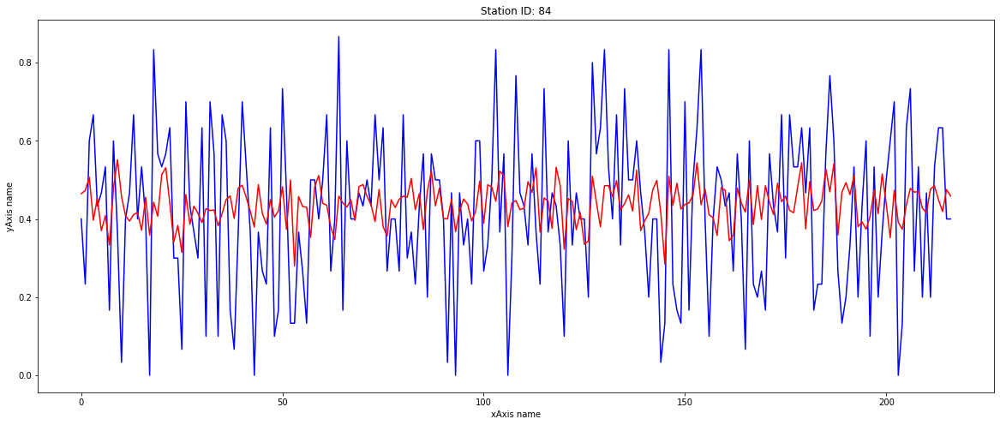

station ID:  90 

-0.0012201295856597572
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00646754  0.00083697 -0.00415715  0.00416968]

Intercept: 
 -0.8794798921846358


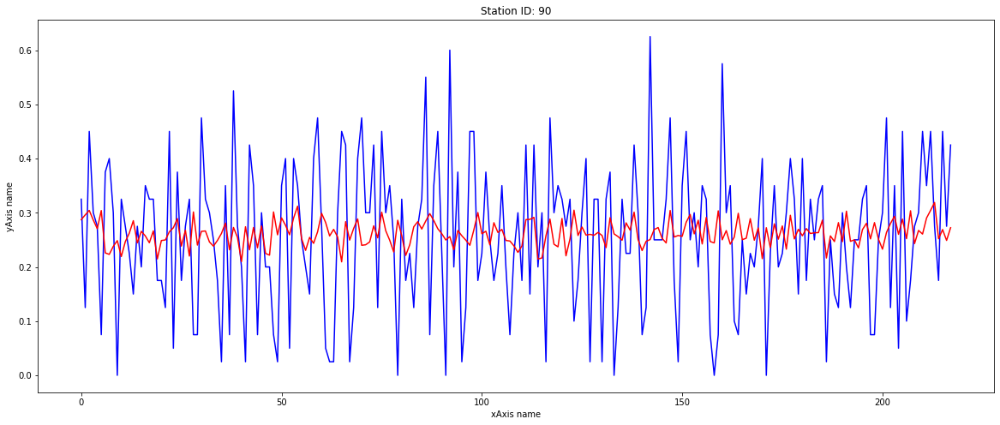

station ID:  66 

0.05735034758390867
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00563219 -0.0013287   0.00576513 -0.01570809]

Intercept: 
 4.737256885653398


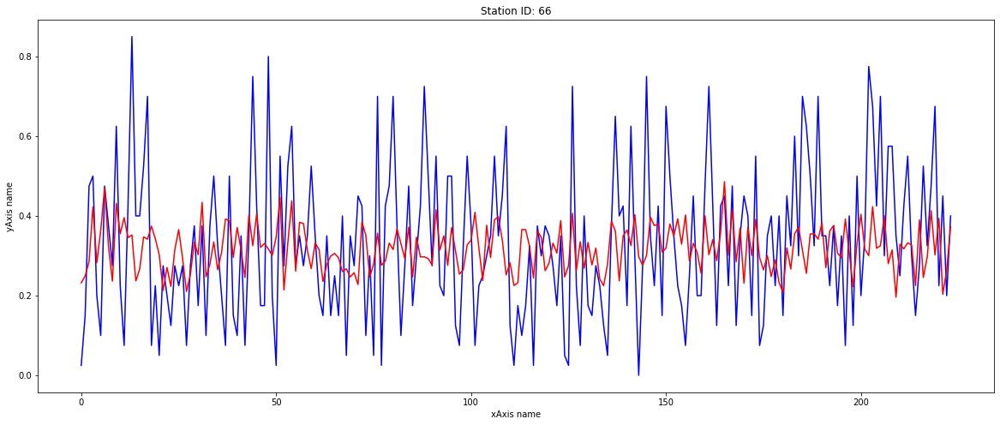

station ID:  56 

0.06085626947623357
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00242723 -0.003696    0.0090743   0.00489761]

Intercept: 
 -1.1446788625068394


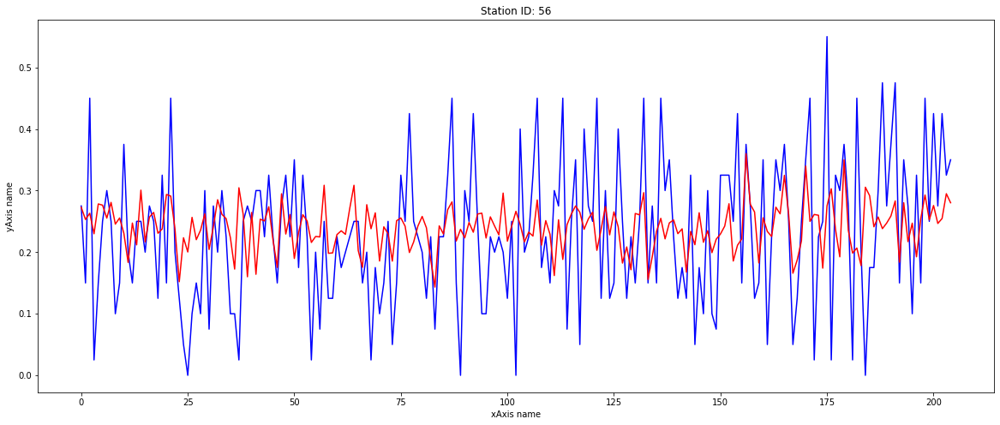

station ID:  79 

-0.014278210065851171
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00118847 -0.0039892   0.01493451  0.00316712]

Intercept: 
 -0.5704674015409015


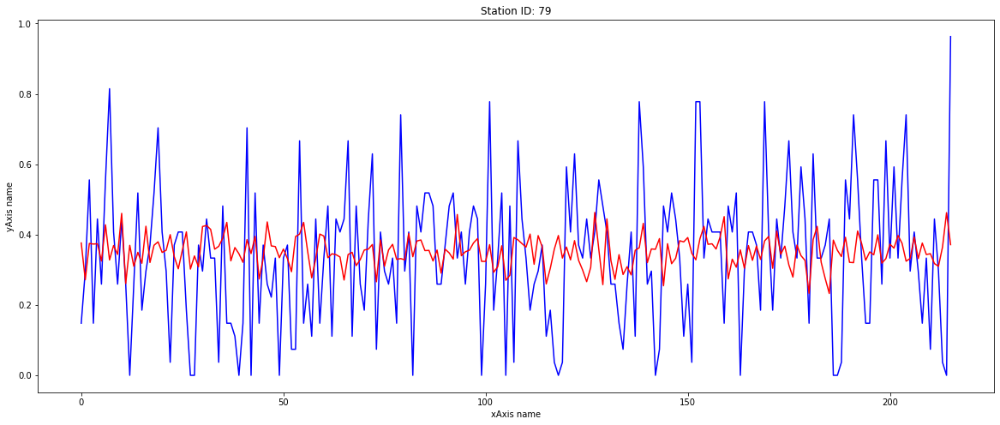

station ID:  85 

0.20465729428452328
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-4.86636708e-03 -3.64027459e-05 -5.41507117e-03 -2.23645635e-02]

Intercept: 
 6.7117297187822


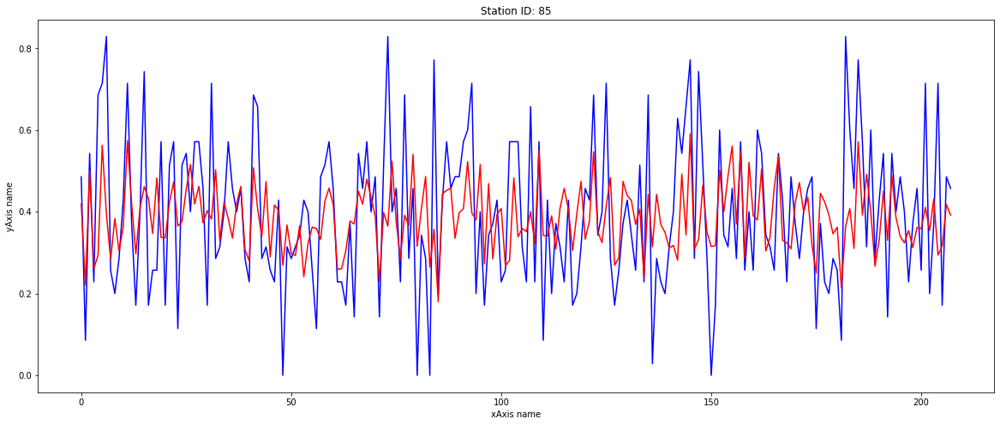

station ID:  92 

0.22317800705396662
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.02168547  0.00068592 -0.04601915  0.00594403]

Intercept: 
 -1.0518556707616655


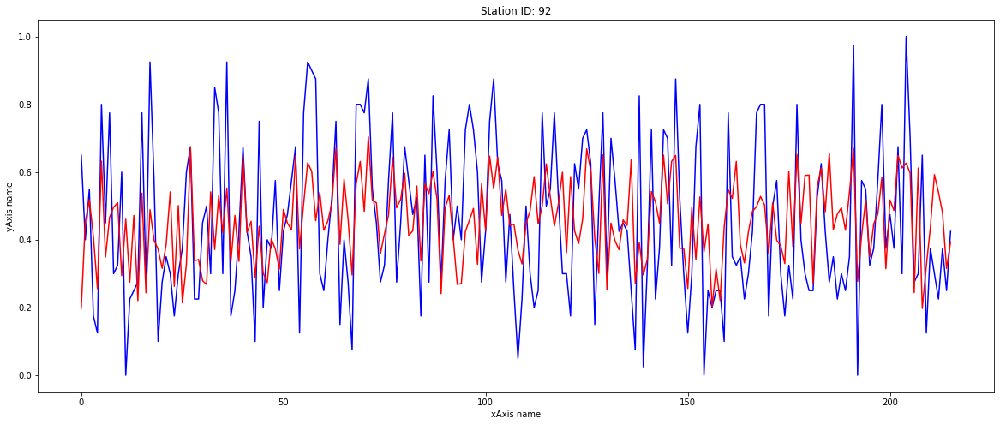

station ID:  13 

0.03502266119047903
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-2.82830442e-03  2.94758449e-05 -9.19305674e-05  8.11364565e-03]

Intercept: 
 -1.972836604521013


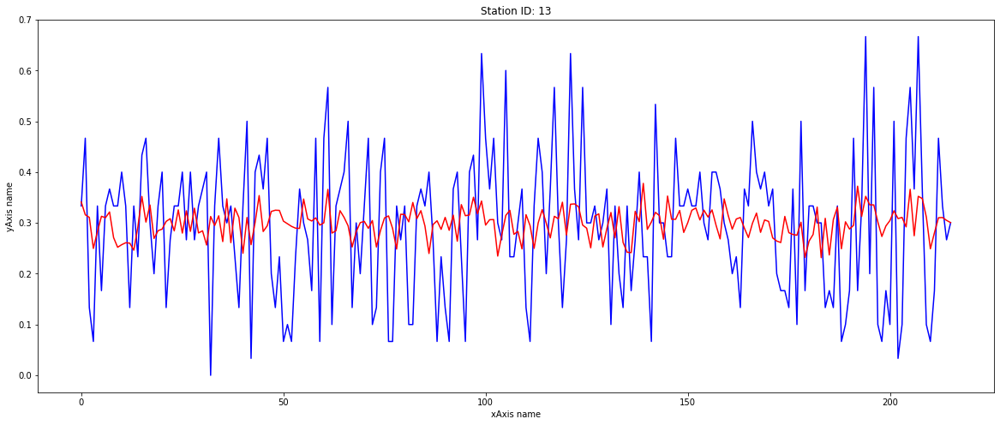

station ID:  15 

0.010039248312410876
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01251345 -0.00301067  0.00469956  0.01334874]

Intercept: 
 -3.2137209158308364


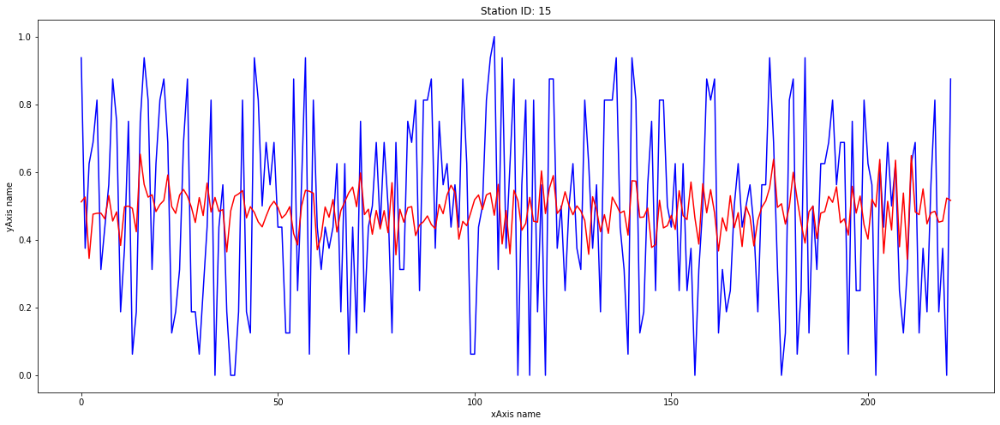

station ID:  16 

0.14147324486433854
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [0.00584801 0.00169934 0.02376564 0.00129326]

Intercept: 
 -0.23454696779308543


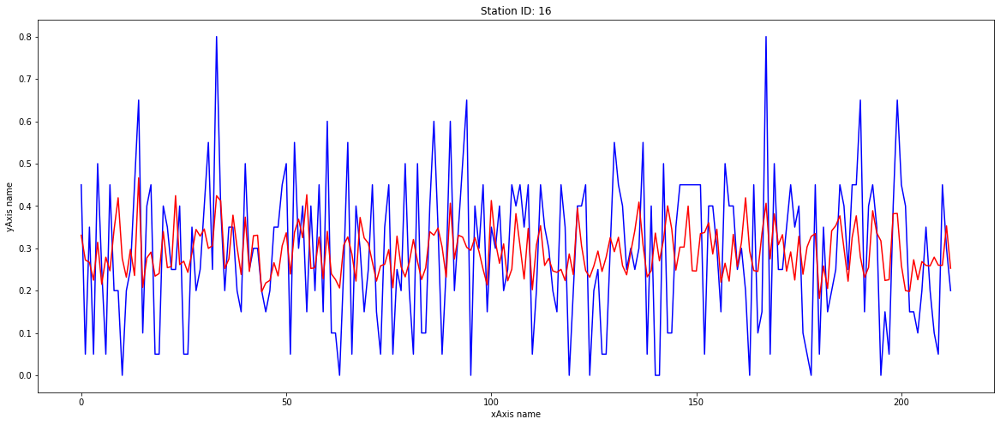

station ID:  93 

0.04310400655253532
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00889952  0.00138336  0.00079983 -0.00543148]

Intercept: 
 1.6619188071388027


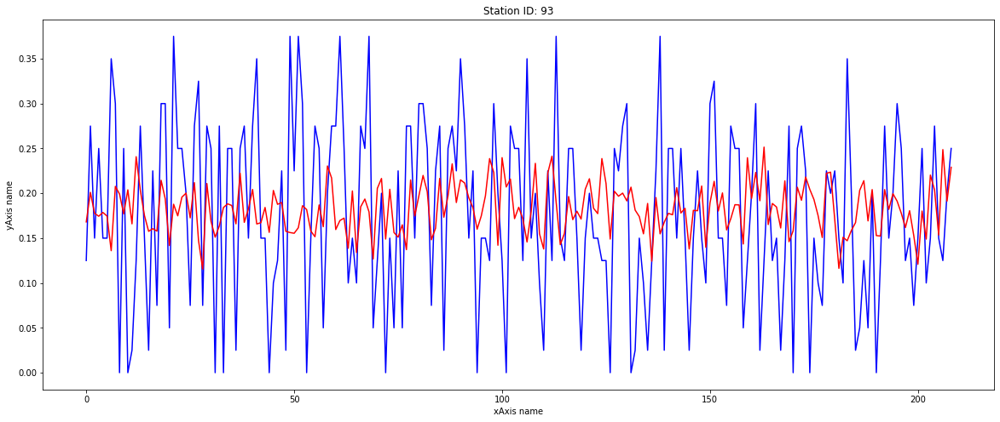

station ID:  25 

0.19871080305425204
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.01950672 -0.00087895 -0.01507806  0.01835307]

Intercept: 
 -4.879659907408597


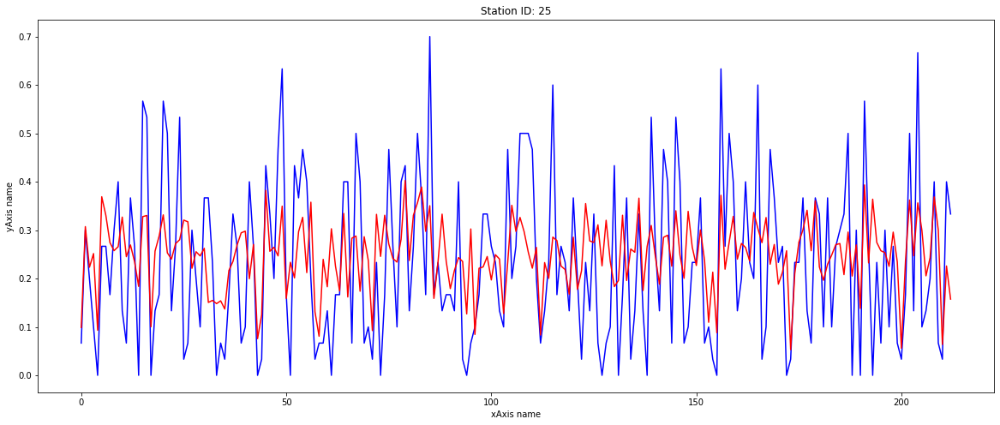

station ID:  101 

0.1392551346908708
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.02520478 -0.00037661  0.01817878 -0.02340321]

Intercept: 
 7.054131026760967


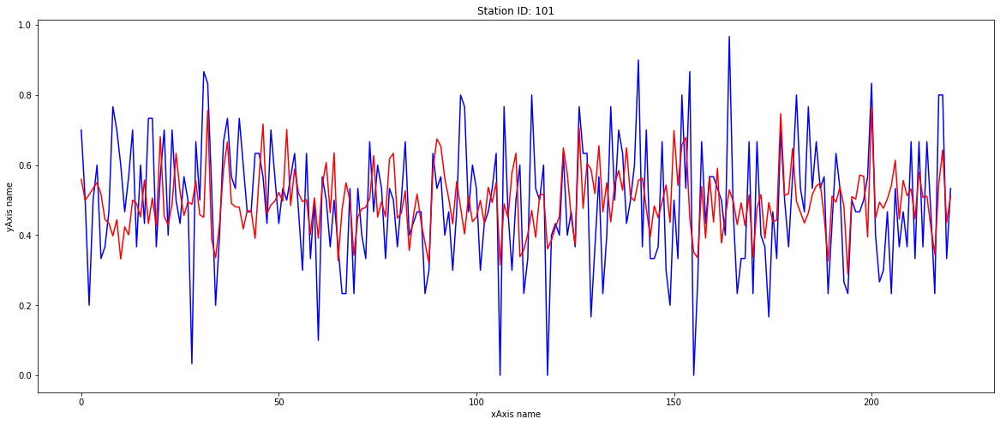

station ID:  12 

-0.02278786472995109
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01518606 -0.00031204  0.01659988 -0.00749668]

Intercept: 
 2.457085814162626


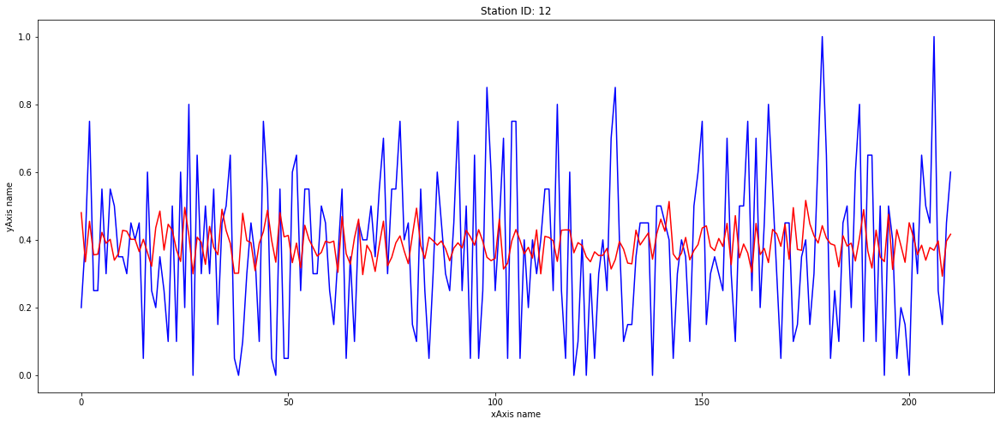

station ID:  47 

0.02479967699779395
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0030345   0.00075888 -0.00754392  0.00162903]

Intercept: 
 -0.2654431985474739


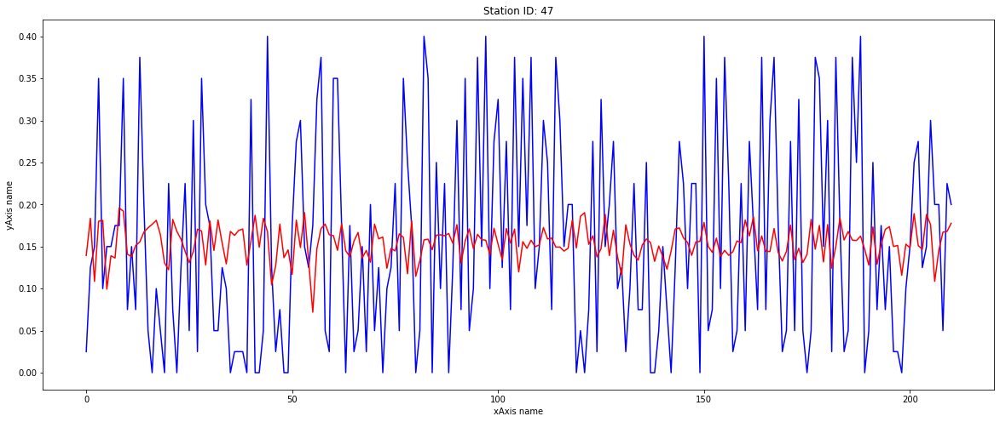

station ID:  86 

-0.022808699047164538
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.0019327  -0.001749   -0.0095156   0.00308378]

Intercept: 
 -0.5581427749724064


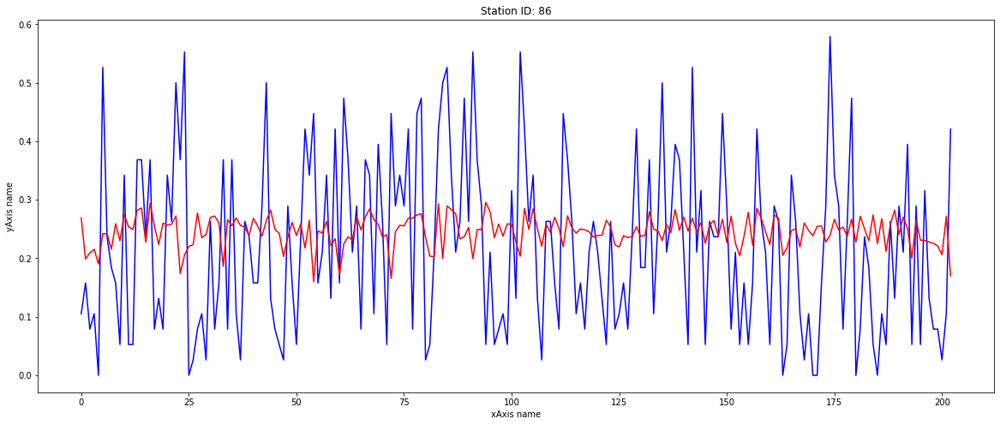

station ID:  22 

0.08715865001462686
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01849189  0.00027051  0.00810626 -0.0182847 ]

Intercept: 
 5.5189915175123305


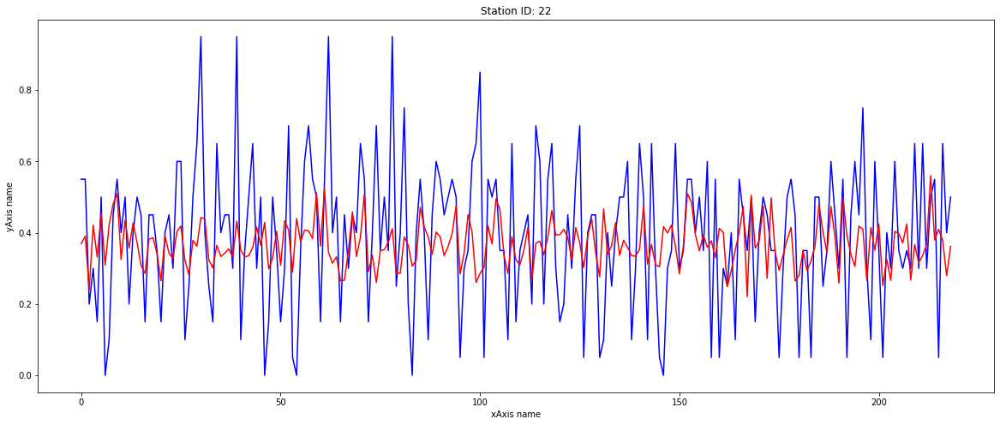

station ID:  106 

0.09940810015836365
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0064765   0.00116714 -0.00262007 -0.01031152]

Intercept: 
 3.234767503769394


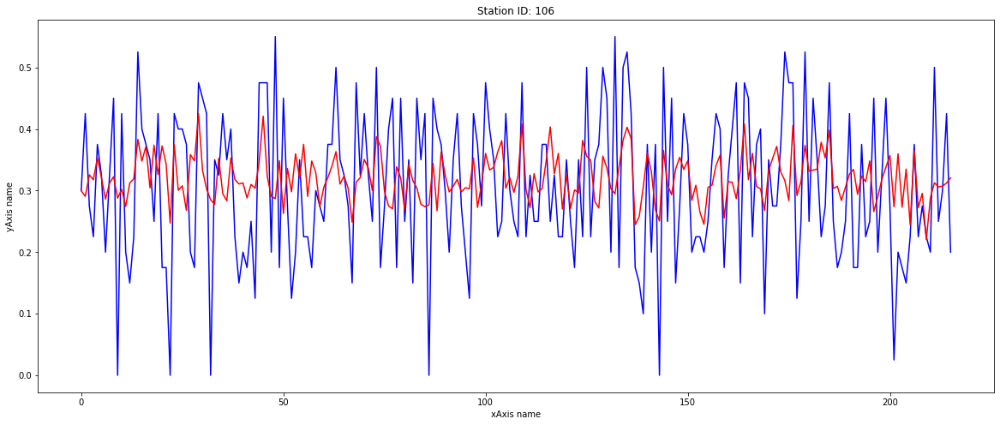

station ID:  105 

0.12105328403809279
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00548657  0.00137617 -0.0110229  -0.01264033]

Intercept: 
 3.871498240912612


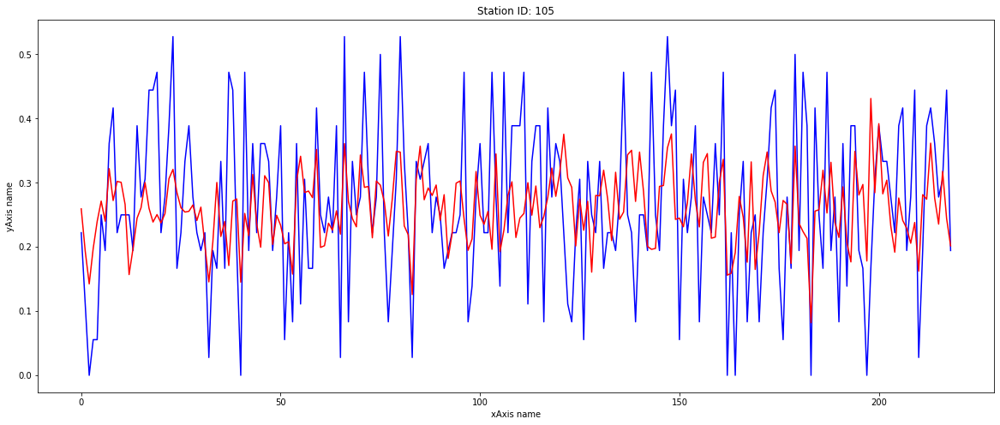

station ID:  89 

0.06002332525956644
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 6.45677561e-03  8.96131851e-05 -5.03012025e-03  7.41318394e-03]

Intercept: 
 -1.9056877241625674


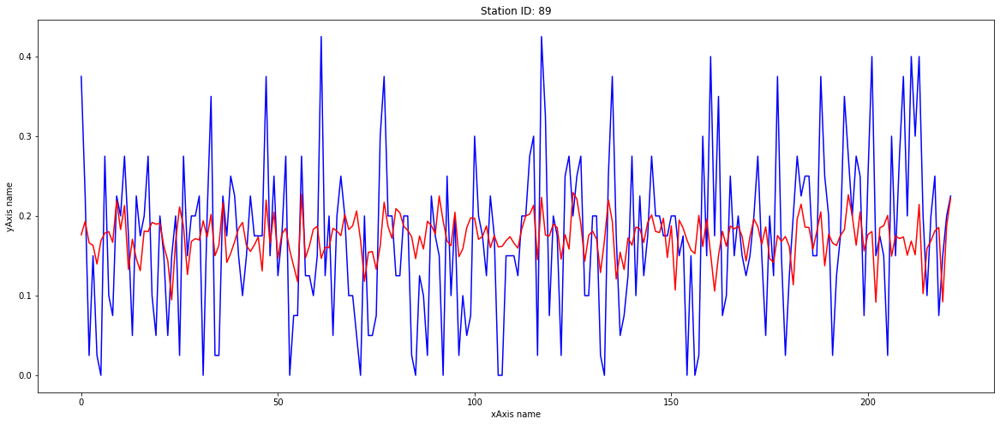

station ID:  58 

-0.007779955510836212
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00397173 -0.00172774  0.00213834 -0.00088533]

Intercept: 
 0.5875950242638961


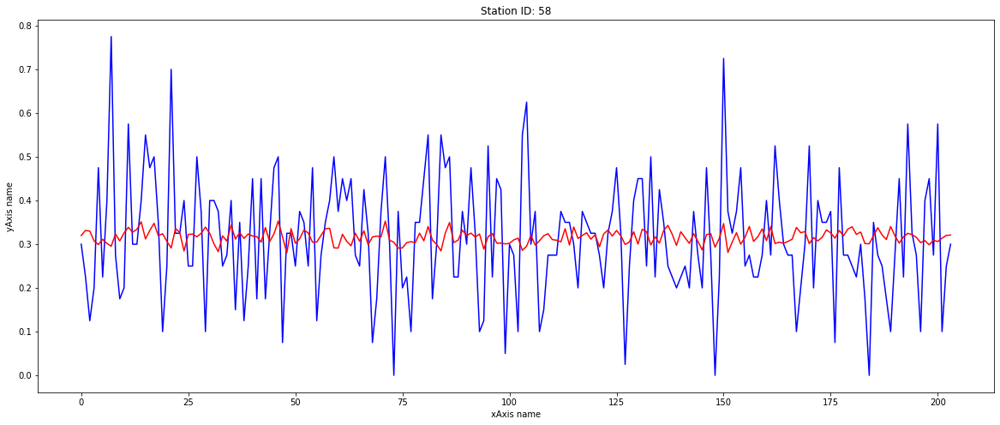

station ID:  3 

0.004909655854219985
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00734973 -0.00590627 -0.01043997  0.0080673 ]

Intercept: 
 -1.866302954152311


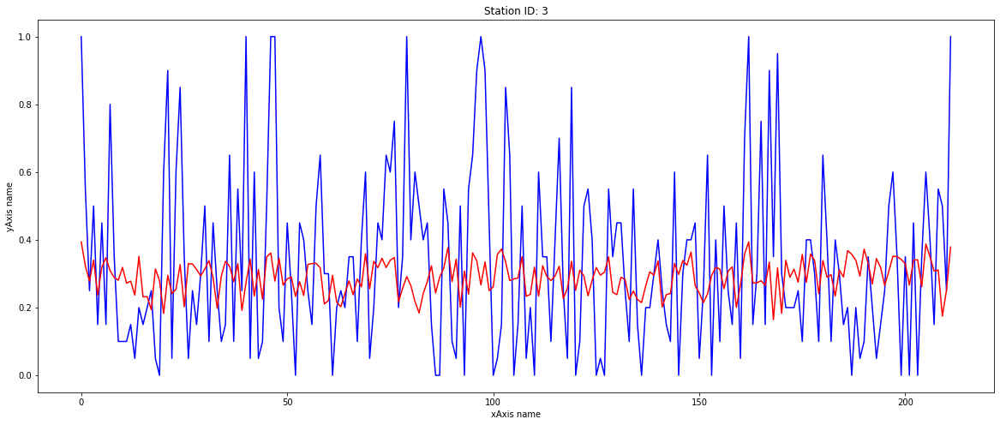

station ID:  61 

0.07385521271418105
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01664986  0.00158577 -0.00275897 -0.00504844]

Intercept: 
 1.8387748201283145


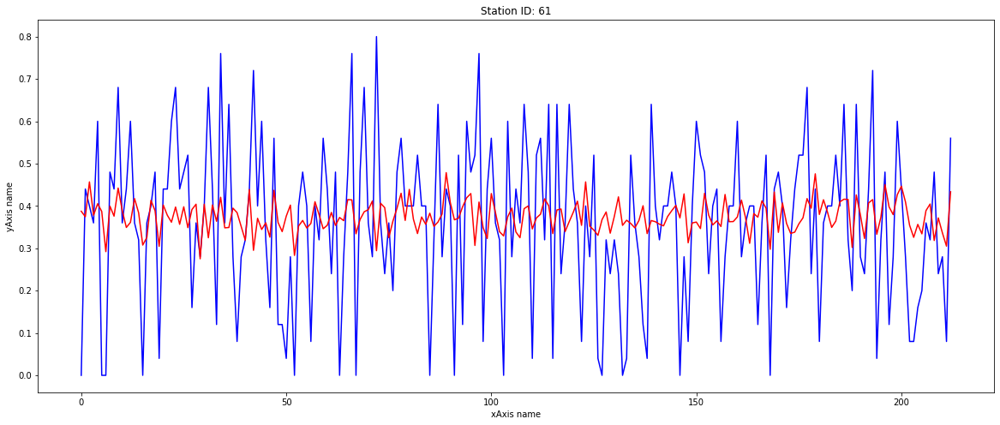

station ID:  4 

-0.09237431509465432
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.02441016 -0.00467085 -0.00102715  0.00704537]

Intercept: 
 -1.4552774987887203


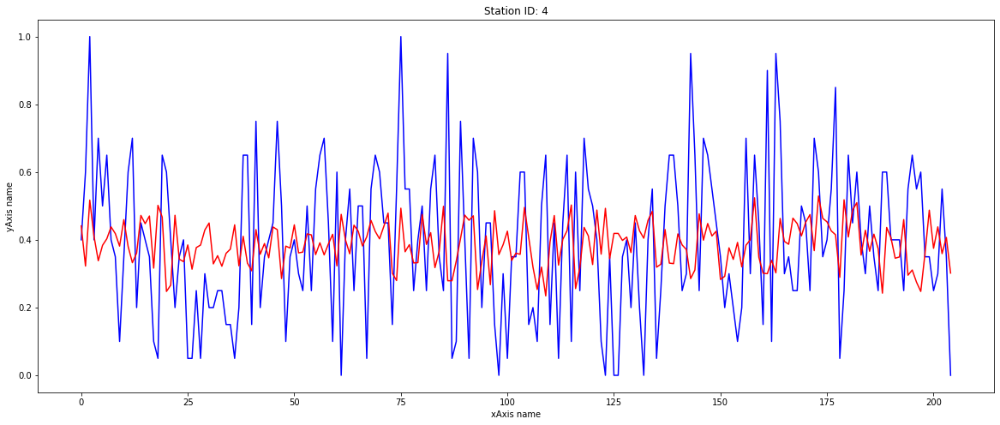

station ID:  88 

0.039767149325413254
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.00491609 -0.00313698 -0.0157135  -0.00216408]

Intercept: 
 1.1167253998109579


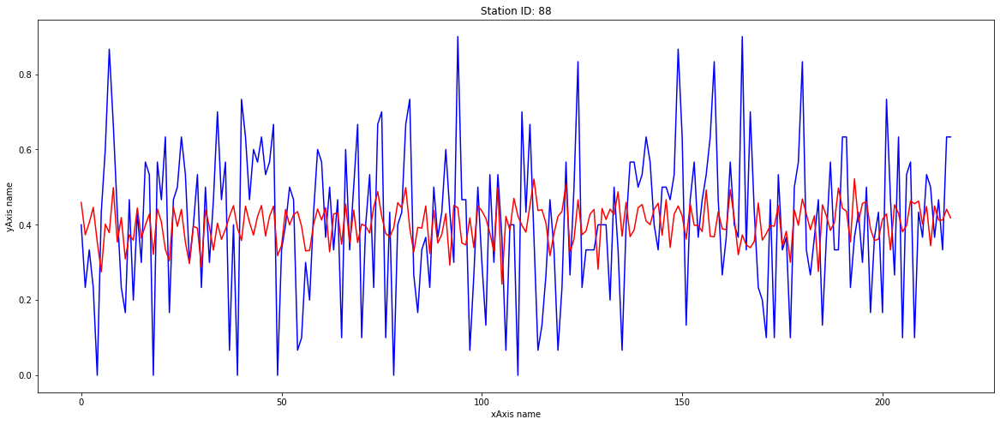

station ID:  39 

0.014350444885733782
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.0086228   0.00087962  0.01316303  0.01339029]

Intercept: 
 -3.5073722284570774


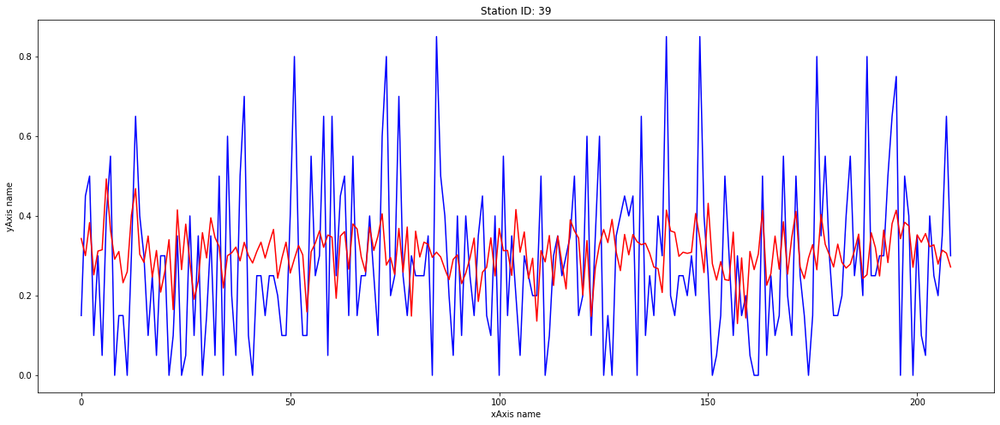

station ID:  87 

0.037503475454028434
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00140099 -0.00105071 -0.00500821 -0.00527513]

Intercept: 
 1.8527376617644016


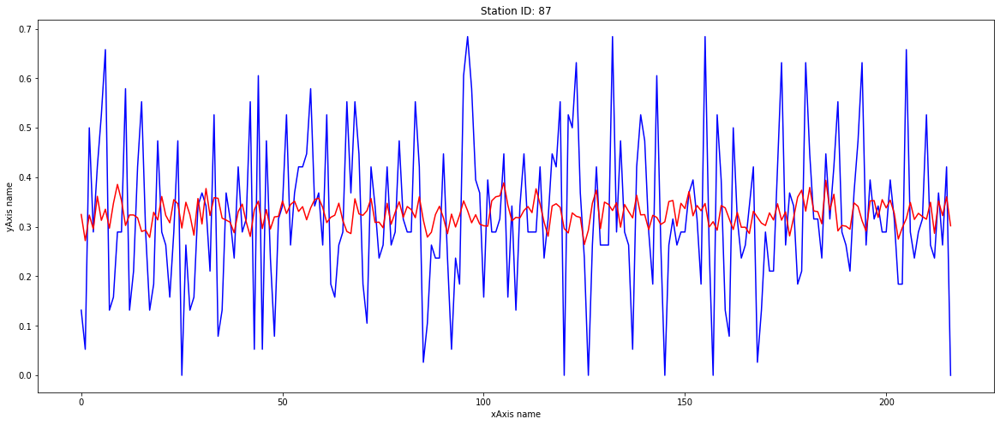

station ID:  24 

0.12259555566143021
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01976306 -0.00365394  0.03025132 -0.01869605]

Intercept: 
 5.690751264238897


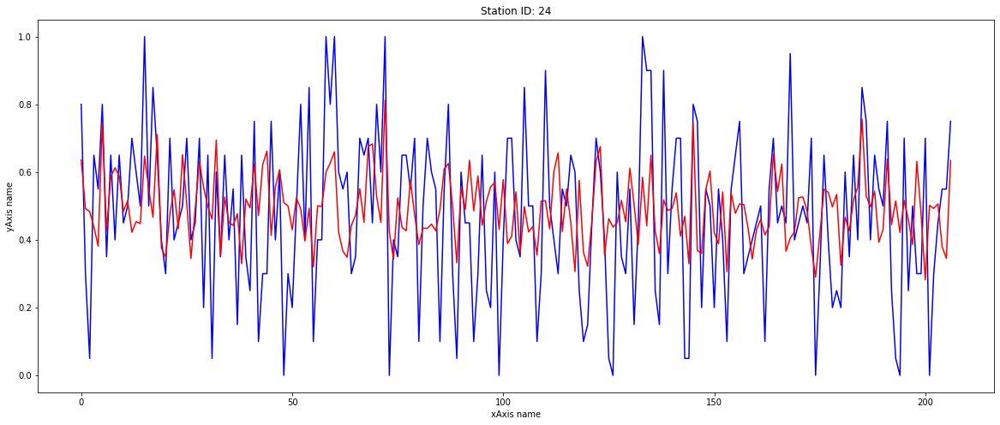

station ID:  45 

0.24922553711555406
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01551827  0.00316244  0.01498387 -0.01756924]

Intercept: 
 5.166352618715646


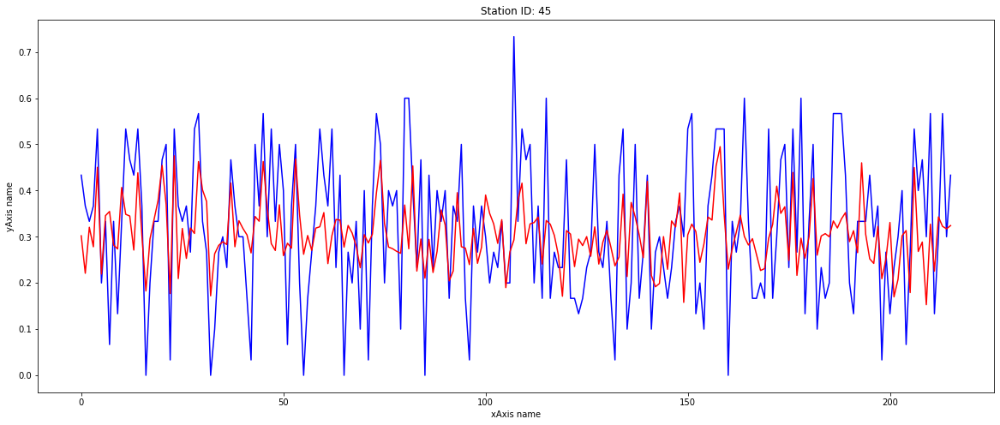

station ID:  103 

0.05656387632832638
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-1.93253804e-02 -3.25324875e-04  9.55941561e-03  6.80476672e-05]

Intercept: 
 0.19413544334680138


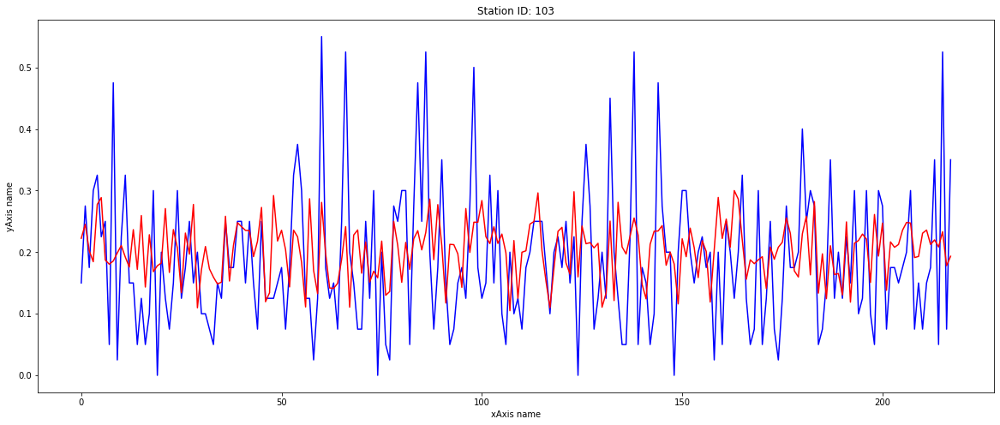

station ID:  48 

0.02110962509516323
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.00544711  0.00139561  0.0083174  -0.00875572]

Intercept: 
 2.7070992879873033


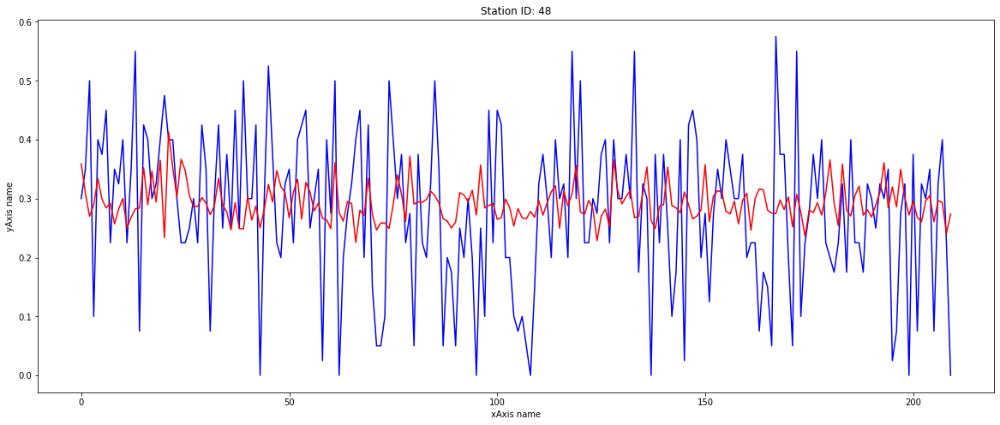

station ID:  54 

0.02134790455764013
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 1.44749730e-02  5.21670544e-04  1.80367605e-03 -3.44359830e-05]

Intercept: 
 0.13383315768221904


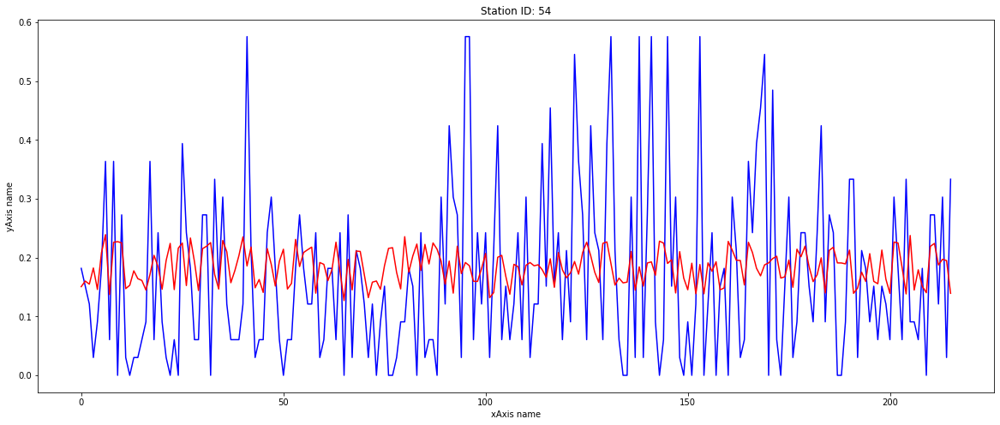

station ID:  82 

0.1323376727200094
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [-0.01612071 -0.00076484  0.01105391 -0.01823644]

Intercept: 
 5.560599119425272


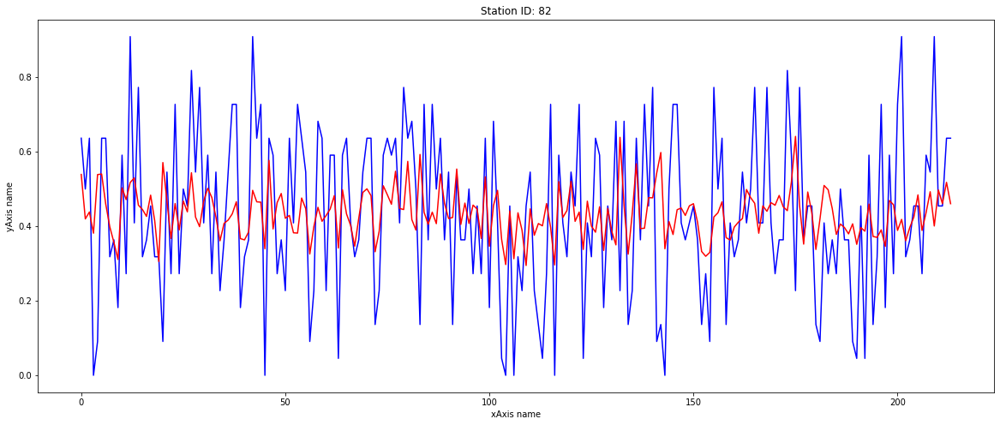

station ID:  68 

0.04890407083587833
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 0.01589178 -0.00191257 -0.0228499   0.01099853]

Intercept: 
 -2.6170354503249063


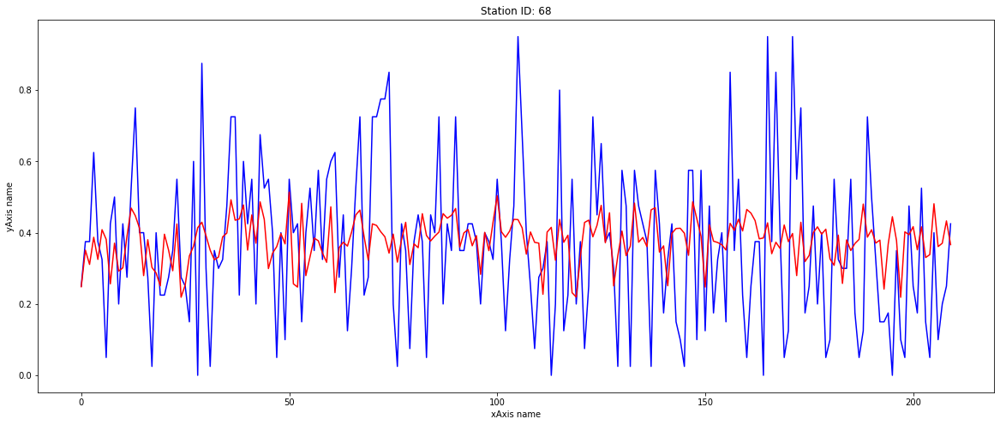

station ID:  507 

0.2348538300007068
Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 1.23899333  0.05622232  0.08139541 -0.1785556 ]

Intercept: 
 43.433180164932914


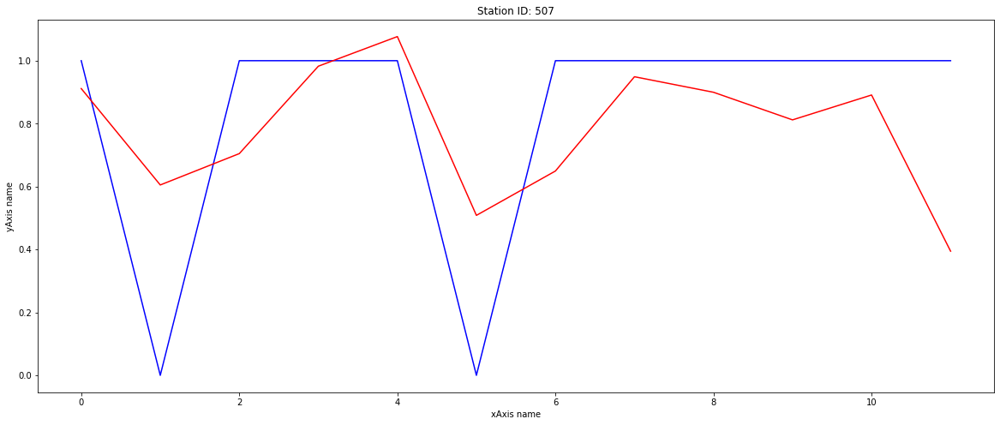

In [317]:
dict_mse = {}
for id_ in dict_stations:
    
    print("station ID: ", id_,'\n')
    features= ['day_of_week','hour','wind_speed','temperature']

    X = dict_stations[id_][features]
    Y = dict_stations[id_].available_bike_ratio

    test_size = 0.33
    seed = 7

    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

    # load the model from disk
    filename = 'station_'+str(id_)+'.sav'
    linreg = pickle.load(open(filename, 'rb'))
    result = linreg.score(X_test, Y_test)
    print(result)

    # Print the estimated linear regression coefficients.
    print("Features: \n", features)
    print("Coeficients: \n", linreg.coef_)
    print("\nIntercept: \n", linreg.intercept_)
    
    linreg_predictions = linreg.predict(X_test[features])
    
    dict_mse[str(id_)] = mean_square_error(Y_test,linreg_predictions)
    
    fig, ax = plt.subplots(figsize=(20,8))

    plt.plot(range(len(Y_test)),Y_test,color ='blue', label = "real")
    plt.plot(range(len(Y_test)),linreg_predictions,color ='red', label = "predicted")
    plt.title('Station ID: '+ str(id_))
    plt.xlabel('xAxis name')
    plt.ylabel('yAxis name')
    plt.show()


<BarContainer object of 110 artists>

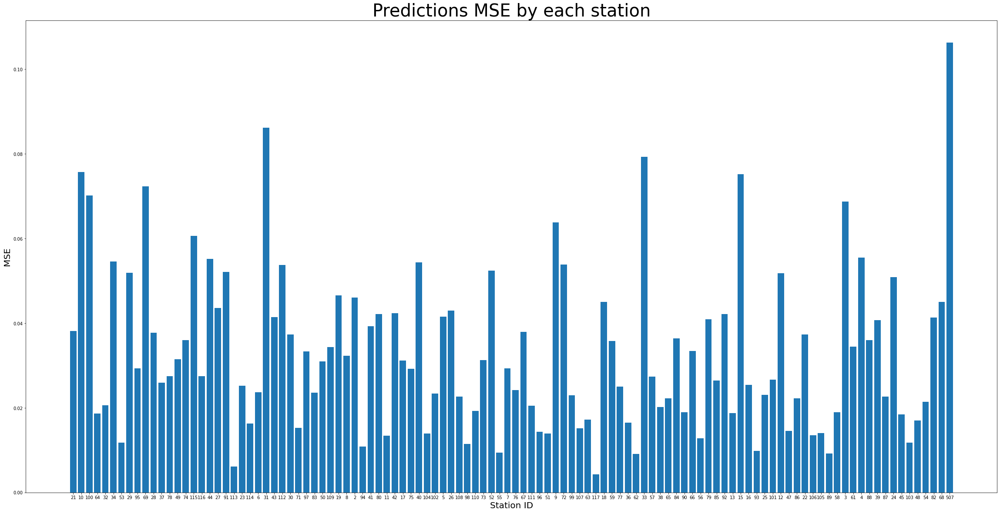

In [327]:
plt.subplots(figsize=(40,20))

keys = dict_mse.keys()
values = dict_mse.values()
plt.title('Predictions MSE by each station',fontsize=40)
plt.xlabel('Station ID',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.bar(keys, values)

In [334]:
# load the model from disk
def make_prediction(df_weather,station_id): 
    
    features= ['day_of_week','hour','wind_speed','temperature']
    
    filename = 'station_'+str(id_)+'.sav'
    linreg = pickle.load(open(filename, 'rb'))
#     result = linreg.score(X_test, Y_test)
#     print(result)

    # Print the estimated linear regression coefficients.
    print("Features: \n", features)
    print("Coeficients: \n", linreg.coef_)
    print("\nIntercept: \n", linreg.intercept_)

    linreg_predictions = linreg.predict(df_weather[features])

    return linreg_predictions

In [339]:
df_weather = dict_stations[21].iloc[[20]]
station_id = 36

print(make_prediction(df_weather,station_id))

Features: 
 ['day_of_week', 'hour', 'wind_speed', 'temperature']
Coeficients: 
 [ 1.23899333  0.05622232  0.08139541 -0.1785556 ]

Intercept: 
 43.433180164932914
[0.58388466]


In [340]:
df_weather

,last_update,timezone,wether_id,weather_icon,visibility,wind_speed,wind_deg,wind_gust,temperature,feels_like,...,rain_1h,snow_1h,sunrise,sunset,number,bike_stands,available_bikes,available_bike_ratio,day_of_week,hour
20,2021-03-06 10:05:09,0,803,04d,10000.0,2.06,180.0,0.0,278.76,275.12,...,0.0,0.0,2021-03-06 07:00:59,2021-03-06 18:11:55,21.0,30.0,6.0,0.2,5,10
